# Analysis on Facebook's rebranding to meta using Tweets

---
Facebook currently rebranded itself to Meta on October 28th allowing it to focus more on its metaverse. On October 19th, Facebook first annouced its plan on new name 'Meta'. However, on Oct 4th its metaverse experience widespread outage over 6 hours. Thus, for this analysis, the tweets that have the words 'facebook' and  'metaverse' in them from Oct 1st to Oct 27th.  

The objective of this analysis is to analyze tweets to deteremine the public opinion regarding facebook's rebranding. 

# Part 1: Webscrapping Twitter Data: 

---
Snscrape a tweet-scraping library, is used to obtain historical tweets without the restrictions of Twitters API.

The search query 'facebook metaverse' is used to obtain tweets that have both words present in them from Oct 1st to Nov 1st.



```
# Installing the snscrape:
pip install git+https://github.com/JustAnotherArchivist/snscrape.git
pip install snscrape

#Importing the snscrape library:
import snscrape.modules.twitter as sntwitter
import pandas as pd

#Oct 1st to Oct 17th:

# Using TwitterSearchScraper to scrape data and append tweets to list
tweets_list1 = [] #List to append tweet data to
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('facebook metaverse since:2021-10-01 until:2021-10-18 lang:en').get_items()):
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.username])

#Oct18th to Oct 27th:
tweets_list2 = []
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('facebook metaverse since:2021-10-18 until:2021-10-28 lang:en').get_items()):
    tweets_list2.append([tweet.date, tweet.id, tweet.content, tweet.username])

#Creating a dataframe from the tweets list above
tweets_df1 = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweets_df2 = pd.DataFrame(tweets_list2, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

#Exporting dataframes into a CSV
tweets_df1.to_csv('facebook_metaverse_tweetsOct1st_Oct17.csv', sep=',', index=False)

tweets_df2.to_csv('facebook_metaverse_tweetsOct18_Oct27.csv', sep=',', index=False)

```






## Importing the Data:

In [ ]:
#import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler

#Imports to connect to Google Drive:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

#Download csv files: 
downloaded1 = drive.CreateFile({'id':'1gd8YcgtmK7Kpstt8uakSyE65WMYiS6NU'}) 
downloaded1.GetContentFile('facebook_metaverse_tweetsOct1st_Oct17.csv')  
#Facebook Metaverse CSV for Oct1st to Oct 17:
df_Oct1st_17 = pd.read_csv('facebook_metaverse_tweetsOct1st_Oct17.csv')


downloaded2 = drive.CreateFile({'id':'100gKDKk7nGEk0t28RbU2aFX8iIlwpPo0'}) 
downloaded2.GetContentFile('facebook_metaverse_tweetsOct18_Oct27.csv')  

#Facebook Metaverse CSV for Oct18 to Oct 27:
df_Oct18_27 = pd.read_csv('facebook_metaverse_tweetsOct18_Oct27.csv')



In [ ]:
display(df_Oct1st_17.head())
print(f'The Shape of the first dataframe: {df_Oct1st_17.shape}')

,Datetime,Tweet Id,Text,Username
0,2021-10-17 23:59:51+00:00,1449887917418160128,"Facebook Is Creating 10,000 Jobs in EU to Help...",TheReal_KDubb
1,2021-10-17 23:58:38+00:00,1449887608243462149,"10,000 Jobs In EU: Facebook’s Big “Metaverse” ...",YourNewsCity1
2,2021-10-17 23:57:41+00:00,1449887368949948427,"Facebook announces 10,000 EU jobs to build ‘me...",malaymail
3,2021-10-17 23:55:05+00:00,1449886716521709573,"Facebook plans to hire 10,000 in EU to build '...",TOIBusiness
4,2021-10-17 23:54:14+00:00,1449886501081333762,"10,000 Jobs In EU: Facebook’s Big “Metaverse” ...",wwwcurrentnews1


The Shape of the first dataframe: (1379, 4)


In [ ]:
display(df_Oct18_27.head())
print(f'The Shape of the second dataframe: {df_Oct18_27.shape}')

,Datetime,Tweet Id,Text,Username
0,2021-10-27 23:56:54+00:00,1453511051287351302,"Facebook: We want 10,000 new recruits to help ...",Iggy
1,2021-10-27 23:56:33+00:00,1453510966243565572,"@TimSweeneyEpic Tim, just a thought here - if ...",WonderInteract1
2,2021-10-27 23:55:42+00:00,1453510749461094404,Facebook wants to be a metaverse company. What...,seriouslyvcs
3,2021-10-27 23:49:38+00:00,1453509223908843522,Watch Facebook's metaverse musical about Open ...,EEKKBB
4,2021-10-27 23:49:15+00:00,1453509128630964225,I quit @Facebook after a week about ten years ...,KnoxViews


The Shape of the second dataframe: (12228, 4)


In [ ]:
#Mergering the three dataframes into one dataframe:

df = pd.concat([df_Oct1st_17.iloc[::-1], df_Oct18_27.iloc[::-1]]).reset_index(drop=True)
display(df.head())
print(f'\033[1mThe shape of merged dataframe: {df.shape}')

,Datetime,Tweet Id,Text,Username
0,2021-10-01 00:06:16+00:00,1443728938317058049,Is Facebook leading us on a journey to the met...,pdelatorrerocha
1,2021-10-01 00:29:20+00:00,1443734741245693955,Facebook Is Spending $50 Million to Build Meta...,CryptoCam22
2,2021-10-01 00:46:08+00:00,1443738971750666242,@Scobleizer I’m a happy Mac/iPhone user. But I...,richardtallent
3,2021-10-01 00:50:05+00:00,1443739962977841157,Global experts met on StreamYard to prep for 2...,sharedmaclean
4,2021-10-01 02:14:32+00:00,1443761218628423680,Facebook is spending $50 million to ‘responsib...,techfreshdirect


The shape of merged dataframe: (13607, 4)


In [ ]:
df.tail()

,Datetime,Tweet Id,Text,Username
13602,2021-10-27 23:49:15+00:00,1453509128630964225,I quit @Facebook after a week about ten years ...,KnoxViews
13603,2021-10-27 23:49:38+00:00,1453509223908843522,Watch Facebook's metaverse musical about Open ...,EEKKBB
13604,2021-10-27 23:55:42+00:00,1453510749461094404,Facebook wants to be a metaverse company. What...,seriouslyvcs
13605,2021-10-27 23:56:33+00:00,1453510966243565572,"@TimSweeneyEpic Tim, just a thought here - if ...",WonderInteract1
13606,2021-10-27 23:56:54+00:00,1453511051287351302,"Facebook: We want 10,000 new recruits to help ...",Iggy


In [ ]:
df.shape

(13607, 4)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13607 entries, 0 to 13606
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Datetime  13607 non-null  object
 1   Tweet Id  13607 non-null  int64 
 2   Text      13607 non-null  object
 3   Username  13607 non-null  object
dtypes: int64(1), object(3)
memory usage: 425.3+ KB


In [ ]:
import plotly.express as px
import plotly.graph_objs as go
df1 = df.copy()
df1['date'] = pd.to_datetime(df1['Datetime'])

date_data = df1.set_index('date').resample('1D').count()

fig = px.line(x=date_data.index, y=date_data.Text,
    labels = {'y': "Tweet Frequency",'x': 'Date'})#'yanchor': 'middle top'
fig.update_layout(title_text='Frequency of Tweets per Day', title_x=0.5)
fig.add_annotation(x="2021-10-04", y=279,
            text="<b>Whistleblower Interview/<br> Widespread Outage</b>",
            showarrow=True,
            arrowhead=1,
            font=dict(
                color="black",
                size=15))
fig.add_annotation(x="2021-10-19", y= 779,
            text="'<b>Meta' First <br> Reported</b>",
            showarrow=True,
            arrowhead=1,
            yanchor='bottom',
            ay=-85,
            font=dict(
                color="black",
                size=15))


fig.show()

#Data Exploration

In [ ]:
display(df.info())
print(f'\n\033[1mThe shape of the dataframe is {df.shape}\033[0m')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13607 entries, 0 to 13606
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Datetime  13607 non-null  object
 1   Tweet Id  13607 non-null  int64 
 2   Text      13607 non-null  object
 3   Username  13607 non-null  object
dtypes: int64(1), object(3)
memory usage: 425.3+ KB


None


The shape of the dataframe is (13607, 4)


In [ ]:
!pip install tabulate
from tabulate import tabulate

In [ ]:
#Check for duplicates or null values:
table = [['Column Name', 'Number of Duplicates', 'Number of Null Values', 'Decription']]
descriptions = ["The date and time the tweet was published. \nFormat: 'year-month-day hour:minutes:seconds:microseconds+UTC00:00'",
                'Unique ID twitter generates per tweet',
                'Tweet created by the user',
                'Individual who wrote the tweet']
count = 0
for i in df.columns:
  name = i
  duplicates = df[str(i)].duplicated().sum()
  nulls =  df[str(i)].isna().sum()
  table.append([name, duplicates, nulls, descriptions[count]])
  count += 1

print('\033[1mData Description Table:\033[0m')
print(tabulate(table, headers='firstrow', tablefmt='fancy_grid'))

Data Description Table:
╒═══════════════╤════════════════════════╤═════════════════════════╤═════════════════════════════════════════════════════════════════════╕
│ Column Name   │   Number of Duplicates │   Number of Null Values │ Decription                                                          │
╞═══════════════╪════════════════════════╪═════════════════════════╪═════════════════════════════════════════════════════════════════════╡
│ Datetime      │                    450 │                       0 │ The date and time the tweet was published.                          │
│               │                        │                         │ Format: 'year-month-day hour:minutes:seconds:microseconds+UTC00:00' │
├───────────────┼────────────────────────┼─────────────────────────┼─────────────────────────────────────────────────────────────────────┤
│ Tweet Id      │                      0 │                       0 │ Unique ID twitter generates per tweet                               │
├──

In [ ]:
display(df[df['Text'].isnull()])
#Dropping missing text row:
df.dropna(subset = ['Text'], inplace=True)
df.shape

,Datetime,Tweet Id,Text,Username


(13607, 4)

In [ ]:
#Dropping the RT (ReTweets) from the dataset:
display(df[df["Text"].str.contains("RT ")==True][:5])
print(f'\n\033[1m{df["Text"].str.contains("RT ").sum()} Retweets present\033[0m')

#Dropping retweets 
df.drop(df[df['Text'].str.contains('RT ')==True].index, inplace=True)
print(f'\033[1m{df["Text"].str.contains("RT ").sum()} Retweets present after dropping\033[0m')

,Datetime,Tweet Id,Text,Username
92,2021-10-02 07:34:16+00:00,1444204070026235912,"RT socialmedia2day ""Will Facebook really becom...",backmanage
139,2021-10-03 07:41:29+00:00,1444568273937387524,"RT techreview ""To build the metaverse, Faceboo...",StrategyMaestro
140,2021-10-03 07:45:17+00:00,1444569227139092481,"RT To build the metaverse, Facebook needs us t...",pmenonkp
152,2021-10-03 14:34:45+00:00,1444672272942370821,"RT socialmedia2day ""The Metaverse is coming, a...",backmanage
516,2021-10-05 14:35:13+00:00,1445397165606588432,#RT @BBCBusiness: Are virtual online worlds th...,EmmbrookBusEco



92 Retweets present
0 Retweets present after dropping


#Data Exploration

In [ ]:
from wordcloud import WordCloud #, STOPWORDS , ImageColorGenerator



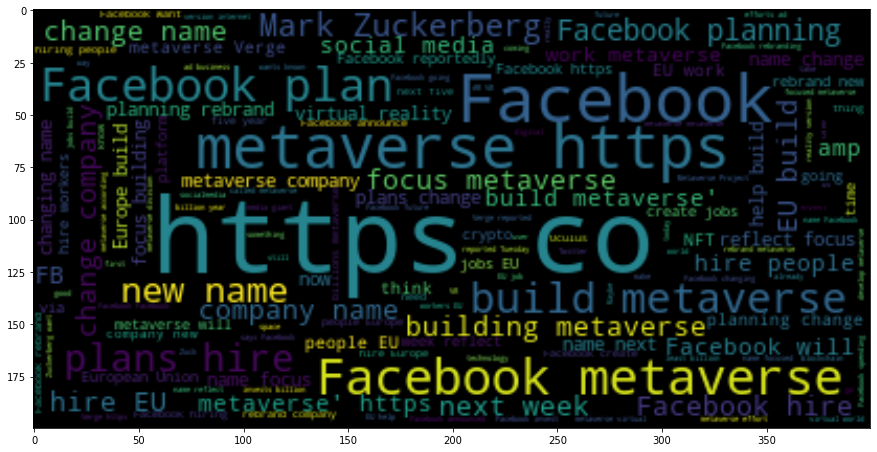

In [ ]:
def visualize(tweet_text):
  tweets = " ".join(tweet for tweet in tweet_text)

  plt.figure(figsize=[15,15])
  tweet_word_cloud = WordCloud(max_font_size=50, max_words=1000).generate(tweets)
  plt.imshow(tweet_word_cloud,interpolation='bilinear')


visualize(df.Text)


#PREPROCESS DATA
Preprocessing the text is an important part of any natural language problem.For preprocessing the tweets the following are done.
*   Remove punctuations
*   Remove tags, @usernames,numbers
*   Remove emojis 
*  Remove stopwords - Stopwords are the words that commonly occurs and doesnot provide any information.
*   Tokenization - process of converting the whole sentence to pieces of words which are called tokens

*   Lemmatization - process of extracting the root word. Stemming can also be used but it will cut the word in a crude way. so I did not do stemming
   
 
 







In [ ]:
import nltk
nltk.download('stopwords')
import re
from nltk.corpus import stopwords
import spacy #for Lemmatization
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
from sklearn.base import BaseEstimator, TransformerMixin

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
#Creating the class to normalize the tweets:
class TweetNormalizer(BaseEstimator, TransformerMixin):
  def __init__(self):
    extra_stopwords = ['facebook','metaverse', 'fb', 'facebooks', 'meta']
    self.stop_words = stopwords.words("english") + extra_stopwords
    self.nlp = spacy.load('en', disable=['parser', 'ner'])

  def clean_tweets(self, text):
    """Remove the '#', '@username', numbers, links, punctuations, stopwords, emjoi's
       and convert all words to lower case"""
    
    text = text.lower() #lowercase 
    text = re.sub("@[A-Za-z0-9]+","", text) #Remove @username
    text = text.replace("#", "").replace("_", " ").replace("—", " ") #Hastags
    text = text.replace("european union", "eu").replace("europe", 'eu') #Converting same word to common form  
    text = re.sub(r"(?:\@|http?\://|https?\://|www)\S+", "", text) #urls
    text = re.sub(r'[^\w\s]', "", text) #punctuations
    text = " ".join(word for word in text.split() if word not in self.stop_words) #stopwords
    text = re.sub(r'[0-9]+', "", text) #numbers
    emojis = re.compile("["                       #remove emoji's
                        u"\U0001F600-\U0001F64F"  # emoticons
                        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                        u"\U0001F680-\U0001F6FF"  # transport & map symbols
                        u"\U0001F1E0-\U0001F1FF"  # flags 
                        u"\U00002702-\U000027B0"
                        u"\U000024C2-\U0001F251"
                        "]+", flags=re.UNICODE)
    text = emojis.sub(r'', text)
    return  text

  def lemmatization(self, text):
    """Normalizing the tweets"""
    text =  text.strip() 
    doc = self.nlp(text)
    #Creating tokens 
    token = [token.lemma_ for token in doc if token.lemma_ != '-PRON-']
    tokens = [i for i in token if i != ' '] #removing white space within tweets
    token_list = [i for i in tokens if len(i) > 1] #Not selecting 1 letter words 
    return token_list #" ".join(token_list) how does word 2 vec take it?

  def fit(self, X, y=None):
    return self

  def transform(self, text):
    cleaned = text.apply(lambda txt: self.clean_tweets(txt)).apply(self.lemmatization)
    return cleaned

In [ ]:
df['clean_text'] = TweetNormalizer().fit_transform(df['Text'])
df.head()

,Datetime,Tweet Id,Text,Username,clean_text
0,2021-10-01 00:06:16+00:00,1443728938317058049,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,pdelatorrerocha,"[lead, us, journey, virtual, reality, guardian]"
1,2021-10-01 00:29:20+00:00,1443734741245693955,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,CryptoCam22,"[spend, million, build, responsibly, via]"
2,2021-10-01 00:46:08+00:00,1443738971750666242,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,richardtallent,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]"
3,2021-10-01 00:50:05+00:00,1443739962977841157,"Global experts met on StreamYard to prep for 2022 produced by @KeithKeller. \n\nKeith's been testing online events that broadcast to YouTube, LinkedIn, Facebook, Twitter + \n\nImpressive convo on: \n#SocialAudio \n#VirtualEvents \n#Metaverse \n\nRecording useful for #remotworkforce https://t.co/DcLyL5hoA4",sharedmaclean,"[global, expert, meet, streamyard, prep, produce, keith, test, online, event, broadcast, youtube, linkedin, twitter, impressive, convo, socialaudio, virtualevent, record, useful, remotworkforce]"
4,2021-10-01 02:14:32+00:00,1443761218628423680,Facebook is spending $50 million to ‘responsibly’ build the metaverse https://t.co/JpkHbRlJgR via @Verge,techfreshdirect,"[spend, million, responsibly, build, via]"


In [ ]:
df['clean_string'] = df['clean_text'].apply(lambda x: ' '.join(map(str, x)))

In [ ]:
#Module to vectorize the whole tweet using a vector of individual word
import math
def norm_vectorize(cleaned_tweet, model):
  """
    converts the whole tweet to a vector using the pretrained model from gensim library

    Arguments:
      cleaned_tweet : preprocessed tweet data

    Returns:
      vector: numpy array of size (50,)      
    """

  vectors = []
  zero_vector = np.zeros(model.vector_size)
  no_of_words = 0
  for token in cleaned_tweet:
    no_of_words = no_of_words+1

    if token in model:
      try:
        vectors.append(model[token])
      except KeyError:
        continue
  #print(vectors)
  if(vectors):
    avg_vector = np.array(vectors).mean(axis=0) * math.sqrt(no_of_words)     #Note: multiply the mean with the squareroot of the number of words in the sentence--> mean of n vector gets shorter as n grows
  else:
    avg_vector = zero_vector
  
  return avg_vector

In [ ]:
#Vectorize the tweet using trained word2vec model
def vectorize(cleaned_tweet, model):

  vectors = []
  zero_vector = np.zeros(model.vector_size)

  for token in cleaned_tweet:

    if token in model:
      try:
        vectors.append(model[token])
      except KeyError:
        continue
  #print(vectors)
  if(vectors):
    avg_vector = np.array(vectors).mean(axis=0)     #Note: multiply the mean with the squareroot of the number of words in the sentence--> mean of n vector gets shorter as n grows
  else:
    avg_vector = zero_vector
  
  return avg_vector
          

#Word2vec

Training Word2vec in our tweet corpus


#Word Embeddings
---

The word embeddings are the dense vector which are represented by float values that are leaarned by the language model. The dense vector for the simlar words will be close to each other. For converting the tweets to vectors, I used the following word embedding methods and compared the results. 


*   Word2vec

*   GloVe

*   Doc2vec
*   BERT









#GloVe: Global Vectors for Word Representation

This model is a log-bilinear regression model in which global corpus statistics are captured. Glove learns the word vector such that the dot product of the word vector equals the logarithm of the words' probability of co-occurance.The model shows ratios of word-word co-occurrence probabilities gives same meaning.


https://nlp.stanford.edu/projects/glove/


Using pretrained model "glove-twitter-100"

In [ ]:
# for using gensim library we need to install gensim version >=4.0.1 
!pip install  gensim==4.0.1 
import gensim
print(gensim.__version__)

     |████████████████████████████████| 23.9 MB 1.5 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0
4.0.1


/usr/local/lib/python3.7/dist-packages/gensim/similarities/__init__.py:15: UserWarning:

The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.



In [ ]:
import gensim.downloader as api
import json
# from gensim.utils import simple_preprocess
# from gensim.corpora import Dictionary
# from gensim.models import TfidfModel


In [ ]:
# GloVe: Global Vectors for Word Representation

glove_twitter_info = api.info('glove-twitter-100')
print(json.dumps(glove_twitter_info, indent=4))

{
    "num_records": 1193514,
    "file_size": 405932991,
    "base_dataset": "Twitter (2B tweets, 27B tokens, 1.2M vocab, uncased)",
    "reader_code": "https://github.com/RaRe-Technologies/gensim-data/releases/download/glove-twitter-100/__init__.py",
    "license": "http://opendatacommons.org/licenses/pddl/",
    "parameters": {
        "dimension": 100
    },
    "description": "Pre-trained vectors based on  2B tweets, 27B tokens, 1.2M vocab, uncased (https://nlp.stanford.edu/projects/glove/)",
    "preprocessing": "Converted to w2v format with `python -m gensim.scripts.glove2word2vec -i <fname> -o glove-twitter-100.txt`.",
    "read_more": [
        "https://nlp.stanford.edu/projects/glove/",
        "https://nlp.stanford.edu/pubs/glove.pdf"
    ],
    "checksum": "b04f7bed38756d64cf55b58ce7e97b15",
    "file_name": "glove-twitter-100.gz",
    "parts": 1
}


In [ ]:
# load the model to memory
model_glove_twitter = api.load('glove-twitter-100')

[==================================================] 100.0% 387.1/387.1MB downloaded


In [ ]:
model_glove_twitter.most_similar("hire")

[('hired', 0.7770240306854248),
 ('hiring', 0.7360792756080627),
 ('employ', 0.6679912805557251),
 ('job', 0.6606391668319702),
 ('recruit', 0.6558773517608643),
 ('assistant', 0.645458996295929),
 ('offered', 0.6357274055480957),
 ('associate', 0.629962146282196),
 ('agent', 0.6266991496086121),
 ('provide', 0.6265841126441956)]

In [ ]:
model_glove_twitter.most_similar("crypto")

[('decentralized', 0.608576238155365),
 ('currency', 0.6017023921012878),
 ('cryptocurrency', 0.5806602835655212),
 ('samajwadi', 0.578969419002533),
 ('tbw', 0.5727472901344299),
 ('currencies', 0.5711565613746643),
 ('videoconferencing', 0.568733811378479),
 ('open-source', 0.5672415494918823),
 ('ventra', 0.5592330098152161),
 ('bartering', 0.5566630363464355)]

In [ ]:
df_glove_pretrained = df.loc[:,['Datetime','Text','clean_text','clean_string']]
df_glove_pretrained .head()

,Datetime,Text,clean_text,clean_string
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content
3,2021-10-01 00:50:05+00:00,"Global experts met on StreamYard to prep for 2022 produced by @KeithKeller. \n\nKeith's been testing online events that broadcast to YouTube, LinkedIn, Facebook, Twitter + \n\nImpressive convo on: \n#SocialAudio \n#VirtualEvents \n#Metaverse \n\nRecording useful for #remotworkforce https://t.co/DcLyL5hoA4","[global, expert, meet, streamyard, prep, produce, keith, test, online, event, broadcast, youtube, linkedin, twitter, impressive, convo, socialaudio, virtualevent, record, useful, remotworkforce]",global expert meet streamyard prep produce keith test online event broadcast youtube linkedin twitter impressive convo socialaudio virtualevent record useful remotworkforce
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsibly’ build the metaverse https://t.co/JpkHbRlJgR via @Verge,"[spend, million, responsibly, build, via]",spend million responsibly build via


In [ ]:
df_glove_pretrained['vector'] = df_glove_pretrained['clean_text'].apply(lambda x: norm_vectorize(x, model_glove_twitter))

In [ ]:
df_glove_pretrained.head()

,Datetime,Text,clean_text,clean_string,vector
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.10172486, -0.121101156, 0.34893513, -0.27188194, 0.08873148, 0.20612782, 0.96593183, -0.49449116, 0.085780725, -1.4883279, 0.7351711, -0.3289198, -7.9138117, -0.4251661, -0.23535067, -0.45195577, -0.4249399, -0.10761425, -0.16771246, -0.1826503, 0.031060757, -0.2125361, 0.42872196, 0.21936771, -0.57921857, -0.42979163, 0.60634553, 0.24679224, 0.5342562, 0.406007, -0.20685938, -0.64070696, -0.28358847, 0.58986855, 1.3452809, -0.09032005, 0.669662, 0.22748165, -1.5083224, -0.03439908, -0.098031014, -0.0007797669, 0.21592619, -0.75753903, 0.74937284, 0.94776356, -0.23925924, -0.43759203, 0.73531234, 0.054690044, 1.2228878, 0.17162186, -0.106623426, -0.21593502, -0.32264572, -0.28599796, -0.48982447, -0.20907864, -0.25084534, -0.6737461, 0.8897527, -0.27723068, -0.2346603, 0.21419159, 0.7806892, 0.31943592, 0.11463203, -0.100834064, -0.054307617, -0.30644175, -0.38981304, -0.07022638, -0.4061173, 0.24316294, 0.5042356, -0.5625898, -0.12963398, -0.20048586, -0.4387628, -0.37872788, 2.4118047, 0.10029028, 1.3997324, 0.9769533, 0.60547143, -0.54525584, 0.25054485, 0.48718718, -0.2694431, 0.30490676, -0.12946084, -0.11000168, -0.08487326, -0.33000588, 0.41474506, -0.15536845, 0.9132731, 0.2191624, -0.19035229, 0.027154647]"
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[-0.4658848, 0.1002519, 0.60970193, -0.5887343, 0.01736039, -0.315528, 0.08448761, -0.7946413, 0.75797933, -0.35692918, -0.074487895, -0.30718657, -7.208054, 0.5772498, -0.54585373, 0.046239644, -1.2154702, 0.5799677, 0.7477814, 0.27693346, -0.5153989, -1.1423088, -0.11847138, -0.7361847, 0.33836046, 0.7517339, 0.26247415, 1.1422282, 0.88775027, -0.36760107, 0.5645155, -0.084818535, -0.89396656, 0.7470525, 1.2726492, -0.6638863, 1.0468832, 0.13278173, -0.6071506, -0.16658258, -0.4641898, 0.8325105, -0.046317935, -0.5737661, 0.47023395, -0.42500493, -0.5581065, 0.3150906, -0.81897247, 0.6985539, 0.66101253, -0.6108707, -0.4850711, 0.3531333, -0.18591744, 0.45406944, -0.023995247, 0.11960327, -0.91541916, 0.03240063, 0.085753195, -0.08969762, -0.6106657, 0.7028637, 1.1484782, 0.62869734, -0.10713248, 0.5153726, -0.5971925, 0.11514096, 0.07933126, 0.10049468, 0.40784538, 0.537519, 0.359761, 0.3807622, -0.78581023, -0.5026189, 0.6224006, 0.44233, 2.2592425, -0.6423686, -0.5129227, 0.1792687, 0.30099264, -0.7388416, -0.02454801, -0.14504923, -0.53097665, 0.43421757, -0.00027727577, 0.591037, 0.41533622, -0.6638801, 1.577247, -0.0502534, -0.2470797, -0.60327506, 0.35164857, -0.8688416]"
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content,"[0.039798114, -0.4549293, -1.334385, 0.5179477, 0.9645154, -0.0071081454, 1.0885739, -2.1785796, 0.95330584, -0.41053218, -0.7596466, -0.70845157, -14.271803, -0.7831198, -0.021683896, 0.05378577, 0.21973856, 0.8258364, 0.27669454, -0.82325006, -0.47687367, 0.7843383, -0.0039962386, 1.2087137, -0.81473935, -0.94895166, 0.53057045, 0.52681845, 0.74184066, 0.10966464, 0.06

In [ ]:
df_glove_pretrained.shape


(13515, 5)

In [ ]:
df_glove_pretrained = df_glove_pretrained.drop(df_glove_pretrained[df_glove_pretrained['vector'].apply(lambda x:not np.any(x))].index )

In [ ]:
df_glove_pretrained.shape

(13427, 5)

In [ ]:
#remove tweets with 4 words or less ---> doesn't give any meaning
df_glove_pretrained =df_glove_pretrained.drop(df_glove_pretrained[df_glove_pretrained['clean_text'].apply(lambda x:len(x)) <4].index)

In [ ]:
df_glove_pretrained.shape

(12401, 5)

#Word2Vec - pretrained model
---

**Word2Vec**

Word2Vec is a word embedding model that captures the semantic and syntactics of the words in our tweets. Thus, words that are similar in context will have similar word vectors. 

Word2Vec is a probabilistic method by [Mikolov et al., 2013]. The paper proposed two methods, Continuous Bag of Words (CBOW) and Continous Skip-Gram.

1. Continous Bag of Words (CBOW) - predicts words from surrounding context words without considering the order of the context words. 
2. Continous Skip-Gram - predicts probability of surround context words taking the word itself as input. This method captures the syntactic and semantic word relationships precisely. 




In [ ]:
glove_twitter_info = api.info('word2vec-google-news-300')
print(json.dumps(glove_twitter_info, indent=4))

{
    "num_records": 3000000,
    "file_size": 1743563840,
    "base_dataset": "Google News (about 100 billion words)",
    "reader_code": "https://github.com/RaRe-Technologies/gensim-data/releases/download/word2vec-google-news-300/__init__.py",
    "license": "not found",
    "parameters": {
        "dimension": 300
    },
    "description": "Pre-trained vectors trained on a part of the Google News dataset (about 100 billion words). The model contains 300-dimensional vectors for 3 million words and phrases. The phrases were obtained using a simple data-driven approach described in 'Distributed Representations of Words and Phrases and their Compositionality' (https://code.google.com/archive/p/word2vec/).",
    "read_more": [
        "https://code.google.com/archive/p/word2vec/",
        "https://arxiv.org/abs/1301.3781",
        "https://arxiv.org/abs/1310.4546",
        "https://www.microsoft.com/en-us/research/publication/linguistic-regularities-in-continuous-space-word-representatio

In [ ]:
#load pretrained word2vec model
wv_model = api.load('word2vec-google-news-300')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
wv_model.most_similar("hire")

[('hiring', 0.7716540694236755),
 ('hires', 0.7073721885681152),
 ('hired', 0.6763538718223572),
 ('Hiring', 0.6515411138534546),
 ('rehire', 0.622090756893158),
 ('employ', 0.6109017133712769),
 ('Hire', 0.5856727957725525),
 ('anybody_illegally_Alhalwani', 0.5749338269233704),
 ('recruit', 0.5641786456108093),
 ('appoint', 0.5387409329414368)]

In [ ]:
wv_model.most_similar("crypto")

[('cryptographic', 0.5337051749229431),
 ('Crypto', 0.5129595398902893),
 ('encryption', 0.5039837956428528),
 ('encryption_algorithms', 0.49573418498039246),
 ('cryptography', 0.4915243983268738),
 ('AES_encryption', 0.48674526810646057),
 ('symmetric_encryption', 0.48474207520484924),
 ('cryptographic_algorithm', 0.48233985900878906),
 ('AES_CCMP', 0.4767688512802124),
 ('encryption_algorithm', 0.47422078251838684)]

In [ ]:
df_word2vec_pretrained = df.loc[:,['Datetime','Text','clean_text','clean_string']]
df_word2vec_pretrained.head()

,Datetime,Text,clean_text,clean_string
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content
3,2021-10-01 00:50:05+00:00,"Global experts met on StreamYard to prep for 2022 produced by @KeithKeller. \n\nKeith's been testing online events that broadcast to YouTube, LinkedIn, Facebook, Twitter + \n\nImpressive convo on: \n#SocialAudio \n#VirtualEvents \n#Metaverse \n\nRecording useful for #remotworkforce https://t.co/DcLyL5hoA4","[global, expert, meet, streamyard, prep, produce, keith, test, online, event, broadcast, youtube, linkedin, twitter, impressive, convo, socialaudio, virtualevent, record, useful, remotworkforce]",global expert meet streamyard prep produce keith test online event broadcast youtube linkedin twitter impressive convo socialaudio virtualevent record useful remotworkforce
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsibly’ build the metaverse https://t.co/JpkHbRlJgR via @Verge,"[spend, million, responsibly, build, via]",spend million responsibly build via


In [ ]:
df_word2vec_pretrained['vector'] = df_word2vec_pretrained['clean_text'].apply(lambda x: norm_vectorize(x, wv_model))

In [ ]:
df_word2vec_pretrained.head()

,Datetime,Text,clean_text,clean_string,vector
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.072659425, 0.11153073, -0.101333246, -0.0938393, -0.27327022, 0.24252202, 0.21162432, -0.279674, -0.011362379, 0.2122971, 0.1740238, -0.17333858, 0.06503856, 0.06448649, -0.3410707, 0.2531618, 0.36598822, 0.035233345, 0.04733079, -0.21015418, 0.21209775, 0.19664891, 0.0737558, 0.23076096, 0.17083436, 0.14372413, -0.25326145, -0.22535387, -0.0384259, -0.35921067, -0.054170646, -0.15527341, -0.3401488, 0.14604145, -0.20631689, -0.29283044, 0.074752495, -0.12339145, 0.18458883, 0.1746156, 0.0334642, -0.18850088, 0.29268095, -0.052077573, 0.117411256, -0.17661524, 0.19176507, 0.3045915, -0.01016634, -0.15369113, -0.29960802, 0.24997236, -0.075749196, 0.02840595, -0.05471883, -0.16106673, -0.22998852, -0.27907598, -0.04534985, -0.2577466, 0.10669673, 0.028676245, 0.23422448, -0.122195415, -0.25423324, 0.021130038, 0.044278394, 0.4342622, -0.1564445, -0.09927132, -0.09727792, 0.098896, 0.111231714, -0.12080003, 0.018575996, -0.2168819, 0.08681257, 0.10445416, 0.21653308, 0.32412684, 0.33130306, -0.20332679, -0.2421981, -0.23988077, 0.11048419, 0.1438238, -0.26836148, -0.00757492, 0.20499626, 0.10475317, 0.024070304, -0.3135618, -0.3593602, -0.2903387, 0.30469117, -0.09249376, -0.02421981, 0.18498752, 0.3330473, -0.29243177, ...]"
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[0.12010131, -0.030352876, -0.17791371, 0.32121643, -0.12364294, -0.008734641, 0.032690074, -0.2471562, 0.2542872, -0.15372968, -0.3122634, -0.006250727, -0.07446281, 0.33209634, -0.1599531, -0.04858644, -0.2029712, 0.3540259, -0.0655098, 0.41227505, -0.068566926, 0.17982441, -0.057976175, 0.09542595, 0.21967621, -0.011791765, 0.12801708, 0.383014, -0.15394804, -0.20113814, 0.066274084, 0.089093335, -0.40697965, -0.25960988, 0.124141075, -0.18719426, -0.010877357, -0.13538693, 0.10534796, 0.23758224, 0.18451929, 0.013374918, 0.28300238, -0.04935072, -0.14925317, -0.26400453, -0.11720796, 0.3124681, -0.40419552, 0.1626008, 0.13909915, 0.21225177, 0.20984975, -0.417625, -0.2358899, -0.23384272, -0.3077323, -0.29789218, -0.028060034, -0.3669641, -0.07812045, 0.044109937, -0.24107608, -0.04716706, 0.14152847, -0.1131136, -0.19068812, 0.016841479, 0.053745333, 0.36150494, 0.2080687, -0.0046675736, 0.34275275, 0.004258137, 0.32689393, -0.35047746, 0.18047269, 0.15951638, -0.13593285, 0.21829778, -0.3579019, -0.25879103, -0.13735223, 0.17387395, -0.06605572, 0.040315825, -0.21312523, 0.32099804, 0.107381485, 0.5760495, 0.27896258, 0.3411969, -0.08341582, -0.39649808, -0.018724885, -0.3360653, -0.07380771, 0.31051648, -0.022928432, 0.033983212, ...]"
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content,"[0.13302527, -0.0028390842, -0.092468455, 0.34358105, -0.43559965, 0.112489946, 0.614035, 0.07712794, 0.574233, 0.40577862, -0.2542551, -0.46628067, -0.11053826, -0.051524345, -0.6439202, 0.4492157, 0.31650808, 0.32277125, 0.2627266, -0.5048237, 0.22345513, 0.2731376, 0.25452724, 0.26225963, 0.1147801

In [ ]:
df_word2vec_pretrained.shape

(13515, 5)

In [ ]:
df_word2vec_pretrained = df_word2vec_pretrained.drop(df_word2vec_pretrained[df_word2vec_pretrained['vector'].apply(lambda x:not np.any(x))].index )

In [ ]:
#remove tweets with 4 words or less ---> doesn't give any meaning
df_word2vec_pretrained =df_word2vec_pretrained.drop(df_word2vec_pretrained[df_word2vec_pretrained['clean_text'].apply(lambda x:len(x)) <4].index)

In [ ]:
df_word2vec_pretrained.shape

(12401, 5)

#Paragraph vector model -Doc2vec

This is an unsupervised algorithm which comes up with fixed length numerical representation using the sentences. Word2vec model gives vector representation of the words and for the whole document embedding we need to average the features of all words in the document. Instead Doc2vec model is trained in a way that it holds the information of document in one of the tokens and provides the embedding for the whole sentence.


In [ ]:
import gensim
import gensim.downloader as api
#dataset =  df['clean_text']#api.load("text8")       #
data = df['clean_text']#[d for d in dataset]
 

In [ ]:
#api.info('text8')

In [ ]:
def tagged_document(list_of_list_of_words):
   for i, list_of_words in enumerate(list_of_list_of_words):
      yield gensim.models.doc2vec.TaggedDocument(list_of_words, [i])
data_for_training = list(tagged_document(data))

In [ ]:
#Initialize the model

model = gensim.models.doc2vec.Doc2Vec(vector_size=50, min_count=2, epochs=50)
#build the vocabulary
model.build_vocab(data_for_training)

In [ ]:
#Train the model

model.train(data_for_training, total_examples=model.corpus_count, epochs=model.epochs)

In [ ]:
model.save("doc2vect.model")
print("Model Saved")

In [ ]:
#New dataframe to add the vector values

df_doc_vec = df.loc[:,['Datetime','Text','clean_text','clean_string']]
df_doc_vec.head()

In [ ]:
df_doc_vec['vector'] = df_doc_vec['clean_text'].apply(lambda x: model.infer_vector(x))

In [ ]:
df_doc_vec.head()

In [ ]:
df_doc_vec = df_doc_vec.drop(df_doc_vec[df_doc_vec['vector'].apply(lambda x:not np.any(x))].index )

In [ ]:
#remove tweets with 4 words or less ---> doesn't give any meaning
df_doc_vec =df_doc_vec.drop(df_doc_vec[df_doc_vec['clean_text'].apply(lambda x:len(x)) <4].index)

#Clustering
---
Clustering is an unsupervised learning method that helps in grouping the similar datapoints.Clustering will be helpful for grouping interpretting unlabelled data. Here, I am using 2 algorithms.

1.  K-means Clustering - It is a centroid based model which will initialize centroids and assign datapoints to the nearest centroid.  It iterates to find local maxima in each iteration.

2.  Agglomeratve clustering - A hierrachical clustering algorithm that starts by assigning each point to seperate clusters and then combines them based on the distance till all the points comes in to one big cluster. Using the dendrogram we can figure out how many clusters in such a way that there is a reasonable distance.



In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

In [ ]:
#Module for finding inertia and silloute scores for 16 different cluster values
def inertia_silhouette(x):
    
  kmeans_per_k = [KMeans(n_clusters=k, random_state=0).fit(X)
                  for k in range(1, 16)]
  inertias = [model.inertia_ for model in kmeans_per_k]
  silhouette_scores = [silhouette_score(X, model.labels_)
                      for model in kmeans_per_k[1:]]
  plot_inertia_silhouette(inertias,silhouette_scores)

In [ ]:
#Module for plotting inertia and silloutte score that helps in finding best cluster

def plot_inertia_silhouette(inertia,silhouette):
  figure,(ax1,ax2) = plt.subplots(figsize=(20,5),nrows=1, ncols=2)
 
  ax1 = plt.subplot(1,2,1)
  plt.title('Kmeans Vs inertia')
  plt.plot(np.arange(1,16), inertia, "bo-")
  plt.xlabel("Number of Clusters")
  plt.ylabel("Inertia")
  ax2 = plt.subplot(1,2,2)
  plt.title('Kmeans vs Silhouette score')
  plt.plot(np.arange(2,16), silhouette, "bo-")
  plt.xlabel("Number of Clusters")
  plt.ylabel("Silhouette score")


In [ ]:
#Used the best parameters that i got in randomized search
def kmeans(no_of_clus,X):
  kmeans_cl = KMeans(n_init= 21,n_clusters=no_of_clus,max_iter  = 400,init ='k-means++',algorithm = 'auto',random_state=0).fit(X)
  centroids = kmeans_cl.cluster_centers_
  labels = kmeans_cl.labels_
  print(f"Inertia : {kmeans_cl.inertia_}, Sillhoute score: {silhouette_score(X, labels)}")
  return labels

In [ ]:
#reducing dimension for visualization

from sklearn.manifold import TSNE
def reduce_dimension(X):
  tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
  TSNE_X = tsne_model.fit_transform(X)
  return TSNE_X

In [ ]:
#module to visualize the clusters
def visualize_clusters(x_tsne, cluster_labels, title):
  plt.figure(figsize=(13,10))
  scatter = plt.scatter(x_tsne[:, 0], x_tsne[:, 1], c=cluster_labels, alpha=0.5)
  plt.legend(handles=scatter.legend_elements()[0], labels=[i for i in np.unique(cluster_labels)],
           fontsize=15,title="Cluster Labels", title_fontsize=16,
           markerscale=3.5, handletextpad=1,
           labelspacing = 1.5, bbox_to_anchor=(1, 1))
  plt.title(str(title), fontsize=15)
  plt.axis('off')


##GloVe pretrained model

###Kmeans on GloVe pretrained model

In [ ]:
#K-means on pretrained glove vector
X =  np.array(df_glove_pretrained['vector'].to_list())

In [ ]:


inertia_silhouette(X)

The first graph is the elbow graph that shows 2 or 3 can be optimum. From the silhoutte score graph, we can clearly see that 2 is the optimum number of cluster since it has highest silloutte score. So I chose 2 clusters

In [ ]:
labels = kmeans(2,X)

Inertia : 386719.1875, Sillhoute score: 0.2228533923625946


In [ ]:
df_kmeans = df_glove_pretrained.copy()
df_kmeans['clusters'] = kmeans(2,X)
df_kmeans.head()

Inertia : 386719.1875, Sillhoute score: 0.2228533923625946


,Datetime,Text,clean_text,clean_string,vector,clusters
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the met...,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.10172486, -0.121101156, 0.34893513, -0.2718...",1
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Meta...,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[-0.4658848, 0.1002519, 0.60970193, -0.5887343...",1
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I...,"[be, happy, maciphone, user, be, concerned, ap...",be happy maciphone user be concerned apple con...,"[0.039798114, -0.4549293, -1.334385, 0.5179477...",0
3,2021-10-01 00:50:05+00:00,Global experts met on StreamYard to prep for 2...,"[global, expert, meet, streamyard, prep, produ...",global expert meet streamyard prep produce kei...,"[0.19509555, 1.24433, 0.13194099, -1.5352013, ...",0
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsib...,"[spend, million, responsibly, build, via]",spend million responsibly build via,"[-0.4658848, 0.1002519, 0.60970193, -0.5887343...",1


In [ ]:
TSNE_X = reduce_dimension(X)

In [ ]:

visualize_clusters(TSNE_X, df_kmeans['clusters'], 'K-means clustering on embedding of glove pretrained model ')

In [ ]:
visualize(df_kmeans.loc[df_kmeans['clusters'] == 0, 'clean_string']) 

In [ ]:
visualize(df_kmeans.loc[df_kmeans['clusters'] == 1, 'clean_string']) 

In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
df_kmeans.loc[df_kmeans['clusters'] == 0, 'Text'].head(20)

In [ ]:
df_kmeans.loc[df_kmeans['clusters'] == 1, 'Text'].head(20)

In [ ]:
df_kmeans['clusters_3'] = kmeans(3,X)
df_kmeans.head()

Inertia : 357307.1875, Sillhoute score: 0.1265428513288498


,Datetime,Text,clean_text,clean_string,vector,clusters,clusters_3
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.10172486, -0.121101156, 0.34893513, -0.27188194, 0.08873148, 0.20612782, 0.96593183, -0.49449116, 0.085780725, -1.4883279, 0.7351711, -0.3289198, -7.9138117, -0.4251661, -0.23535067, -0.45195577, -0.4249399, -0.10761425, -0.16771246, -0.1826503, 0.031060757, -0.2125361, 0.42872196, 0.21936771, -0.57921857, -0.42979163, 0.60634553, 0.24679224, 0.5342562, 0.406007, -0.20685938, -0.64070696, -0.28358847, 0.58986855, 1.3452809, -0.09032005, 0.669662, 0.22748165, -1.5083224, -0.03439908, -0.098031014, -0.0007797669, 0.21592619, -0.75753903, 0.74937284, 0.94776356, -0.23925924, -0.43759203, 0.73531234, 0.054690044, 1.2228878, 0.17162186, -0.106623426, -0.21593502, -0.32264572, -0.28599796, -0.48982447, -0.20907864, -0.25084534, -0.6737461, 0.8897527, -0.27723068, -0.2346603, 0.21419159, 0.7806892, 0.31943592, 0.11463203, -0.100834064, -0.054307617, -0.30644175, -0.38981304, -0.07022638, -0.4061173, 0.24316294, 0.5042356, -0.5625898, -0.12963398, -0.20048586, -0.4387628, -0.37872788, 2.4118047, 0.10029028, 1.3997324, 0.9769533, 0.60547143, -0.54525584, 0.25054485, 0.48718718, -0.2694431, 0.30490676, -0.12946084, -0.11000168, -0.08487326, -0.33000588, 0.41474506, -0.15536845, 0.9132731, 0.2191624, -0.19035229, 0.027154647]",1,2
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[-0.4658848, 0.1002519, 0.60970193, -0.5887343, 0.01736039, -0.315528, 0.08448761, -0.7946413, 0.75797933, -0.35692918, -0.074487895, -0.30718657, -7.208054, 0.5772498, -0.54585373, 0.046239644, -1.2154702, 0.5799677, 0.7477814, 0.27693346, -0.5153989, -1.1423088, -0.11847138, -0.7361847, 0.33836046, 0.7517339, 0.26247415, 1.1422282, 0.88775027, -0.36760107, 0.5645155, -0.084818535, -0.89396656, 0.7470525, 1.2726492, -0.6638863, 1.0468832, 0.13278173, -0.6071506, -0.16658258, -0.4641898, 0.8325105, -0.046317935, -0.5737661, 0.47023395, -0.42500493, -0.5581065, 0.3150906, -0.81897247, 0.6985539, 0.66101253, -0.6108707, -0.4850711, 0.3531333, -0.18591744, 0.45406944, -0.023995247, 0.11960327, -0.91541916, 0.03240063, 0.085753195, -0.08969762, -0.6106657, 0.7028637, 1.1484782, 0.62869734, -0.10713248, 0.5153726, -0.5971925, 0.11514096, 0.07933126, 0.10049468, 0.40784538, 0.537519, 0.359761, 0.3807622, -0.78581023, -0.5026189, 0.6224006, 0.44233, 2.2592425, -0.6423686, -0.5129227, 0.1792687, 0.30099264, -0.7388416, -0.02454801, -0.14504923, -0.53097665, 0.43421757, -0.00027727577, 0.591037, 0.41533622, -0.6638801, 1.577247, -0.0502534, -0.2470797, -0.60327506, 0.35164857, -0.8688416]",1,2
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content,"[0.039798114, -0.4549293, -1.334385, 0.5179477, 0.9645154, -0.0071081454, 1.0885739, -2.1785796, 0.95330584, -0.41053218, -0.7596466, -0.70845157, -14.271803, -0.7831198, -0.021683896, 0.05378577, 0.21973856, 0.8258364, 0.27669454, -0.82325006, -0.47687367, 0.7843383, -0.0039962386, 1.2087137, -0.81473935, -0.94895166, 0.53057045, 0.52681845, 

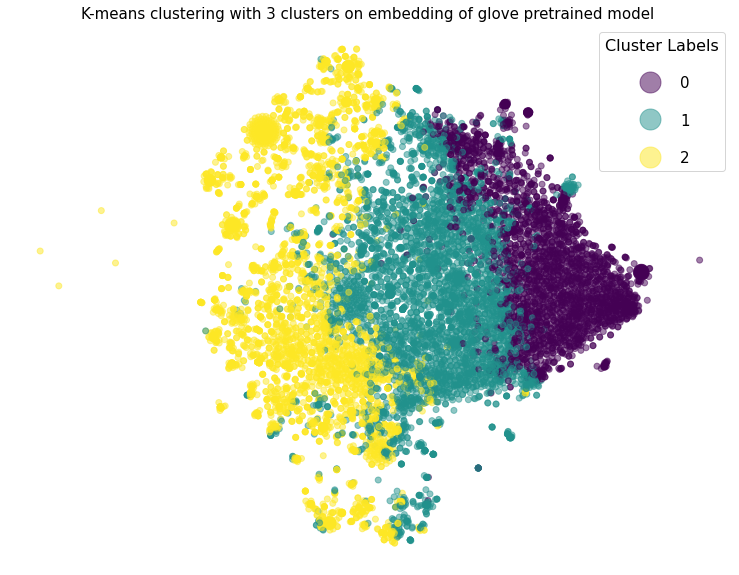

In [ ]:
visualize_clusters(TSNE_X, df_kmeans['clusters_3'], 'K-means clustering with 3 clusters on embedding of glove pretrained model ')

In [ ]:
visualize(df_kmeans.loc[df_kmeans['clusters_3'] == 0, 'clean_string']) 

In [ ]:
visualize(df_kmeans.loc[df_kmeans['clusters_3'] == 1, 'clean_string']) 

In [ ]:
visualize(df_kmeans.loc[df_kmeans['clusters_3'] == 0, 'clean_string']) 

In 3 clusters all the words come repeatedly in ourall the clusters

###Agglomerative Clustering on Glove pretrained model

In [ ]:
from sklearn.cluster import AgglomerativeClustering
def agg_cluster(no_of_clusters,X):
  cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='cosine', linkage='complete').fit(X)
  return cluster
  #pred = cluster.fit_predict(X)

In [ ]:
agg = agg_cluster(20,X)

In [ ]:
pd.Series(agg.labels_).value_counts()[:10]

0     7357
7     2009
6     1342
4     1264
1      263
11      32
3       27
5       19
10      18
9       16
dtype: int64

In [ ]:
df_agglo = df_glove_pretrained.copy()
df_agglo['clusters'] = agg.labels_


In [ ]:
visualize(df_agglo.loc[df_agglo['clusters'] == 0, 'clean_string']) 

In [ ]:
visualize(df_agglo.loc[df_agglo['clusters'] == 7, 'clean_string']) 

In [ ]:
visualize(df_agglo.loc[df_agglo['clusters'] == 6, 'clean_string']) 

In [ ]:
visualize(df_agglo.loc[df_agglo['clusters'] == 4, 'clean_string']) 

In [ ]:
visualize(df_agglo.loc[df_agglo['clusters'] == 1, 'clean_string']) 

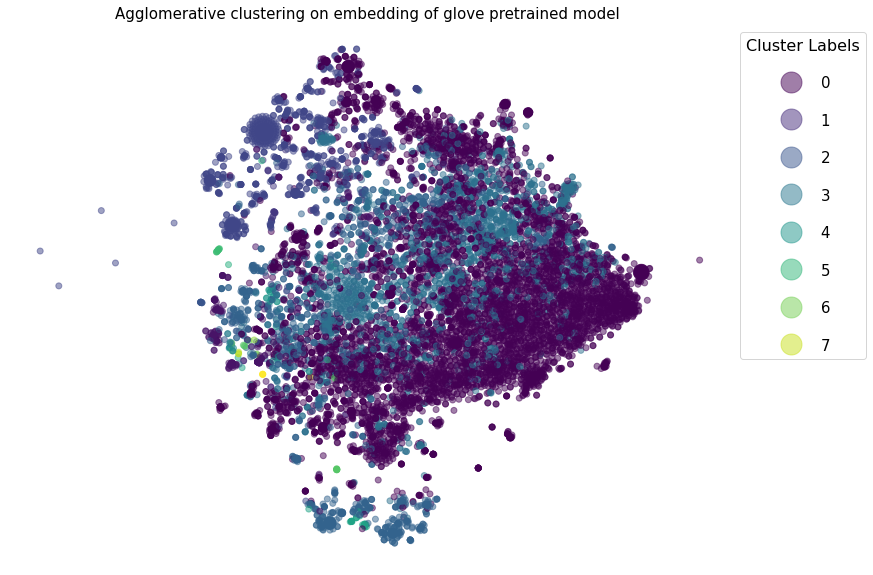

In [ ]:
visualize_clusters(TSNE_X, df_agglo['clusters'], 'Agglomerative clustering on embedding of glove pretrained model ')

##Word2vec model

###Kmeans on Word2vec pretrained model

In [ ]:
X =  np.array(df_word2vec_pretrained['vector'].to_list())

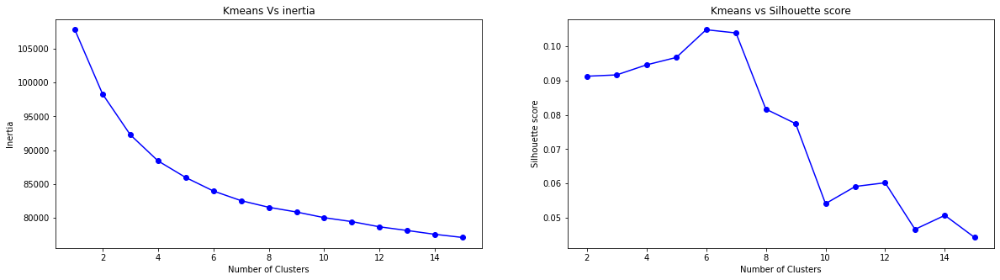

In [ ]:
#K-means on pretrained Word2vec vector
#X =  np.array(df_word2vec_pretrained['vector'].to_list())

inertia_silhouette(X)

The first graph is the elbow graph that shows 6 can be optimum number of clusters. From the silhoutte score graph, we can see that sillhoutte score for 2 cluster is higher than 6. I am picking 4 as optimum number of clusters since,inertia is reducing a bit slowly after 4 clusters itself and silhoutte score is not that worse compared to the score of cluster 8.

In [ ]:
labels = kmeans(4,X)

Inertia : 88418.734375, Sillhoute score: 0.09454488754272461


In [ ]:
df_kmeans_word2vec = df_word2vec_pretrained.copy()
df_kmeans_word2vec['clusters'] = labels
df_kmeans_word2vec.head()

,Datetime,Text,clean_text,clean_string,vector,clusters
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.072659425, 0.11153073, -0.101333246, -0.0938393, -0.27327022, 0.24252202, 0.21162432, -0.279674, -0.011362379, 0.2122971, 0.1740238, -0.17333858, 0.06503856, 0.06448649, -0.3410707, 0.2531618, 0.36598822, 0.035233345, 0.04733079, -0.21015418, 0.21209775, 0.19664891, 0.0737558, 0.23076096, 0.17083436, 0.14372413, -0.25326145, -0.22535387, -0.0384259, -0.35921067, -0.054170646, -0.15527341, -0.3401488, 0.14604145, -0.20631689, -0.29283044, 0.074752495, -0.12339145, 0.18458883, 0.1746156, 0.0334642, -0.18850088, 0.29268095, -0.052077573, 0.117411256, -0.17661524, 0.19176507, 0.3045915, -0.01016634, -0.15369113, -0.29960802, 0.24997236, -0.075749196, 0.02840595, -0.05471883, -0.16106673, -0.22998852, -0.27907598, -0.04534985, -0.2577466, 0.10669673, 0.028676245, 0.23422448, -0.122195415, -0.25423324, 0.021130038, 0.044278394, 0.4342622, -0.1564445, -0.09927132, -0.09727792, 0.098896, 0.111231714, -0.12080003, 0.018575996, -0.2168819, 0.08681257, 0.10445416, 0.21653308, 0.32412684, 0.33130306, -0.20332679, -0.2421981, -0.23988077, 0.11048419, 0.1438238, -0.26836148, -0.00757492, 0.20499626, 0.10475317, 0.024070304, -0.3135618, -0.3593602, -0.2903387, 0.30469117, -0.09249376, -0.02421981, 0.18498752, 0.3330473, -0.29243177, ...]",3
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[0.12010131, -0.030352876, -0.17791371, 0.32121643, -0.12364294, -0.008734641, 0.032690074, -0.2471562, 0.2542872, -0.15372968, -0.3122634, -0.006250727, -0.07446281, 0.33209634, -0.1599531, -0.04858644, -0.2029712, 0.3540259, -0.0655098, 0.41227505, -0.068566926, 0.17982441, -0.057976175, 0.09542595, 0.21967621, -0.011791765, 0.12801708, 0.383014, -0.15394804, -0.20113814, 0.066274084, 0.089093335, -0.40697965, -0.25960988, 0.124141075, -0.18719426, -0.010877357, -0.13538693, 0.10534796, 0.23758224, 0.18451929, 0.013374918, 0.28300238, -0.04935072, -0.14925317, -0.26400453, -0.11720796, 0.3124681, -0.40419552, 0.1626008, 0.13909915, 0.21225177, 0.20984975, -0.417625, -0.2358899, -0.23384272, -0.3077323, -0.29789218, -0.028060034, -0.3669641, -0.07812045, 0.044109937, -0.24107608, -0.04716706, 0.14152847, -0.1131136, -0.19068812, 0.016841479, 0.053745333, 0.36150494, 0.2080687, -0.0046675736, 0.34275275, 0.004258137, 0.32689393, -0.35047746, 0.18047269, 0.15951638, -0.13593285, 0.21829778, -0.3579019, -0.25879103, -0.13735223, 0.17387395, -0.06605572, 0.040315825, -0.21312523, 0.32099804, 0.107381485, 0.5760495, 0.27896258, 0.3411969, -0.08341582, -0.39649808, -0.018724885, -0.3360653, -0.07380771, 0.31051648, -0.022928432, 0.033983212, ...]",3
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content,"[0.13302527, -0.0028390842, -0.092468455, 0.34358105, -0.43559965, 0.112489946, 0.614035, 0.07712794, 0.574233, 0.40577862, -0.2542551, -0.46628067, -0.11053826, -0.051524345, -0.6439202, 0.4492157, 0.31650808, 0.32277125, 0.2627266, -0.5048237, 0.22345513, 0.2731376, 0.25452724, 0.262259

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


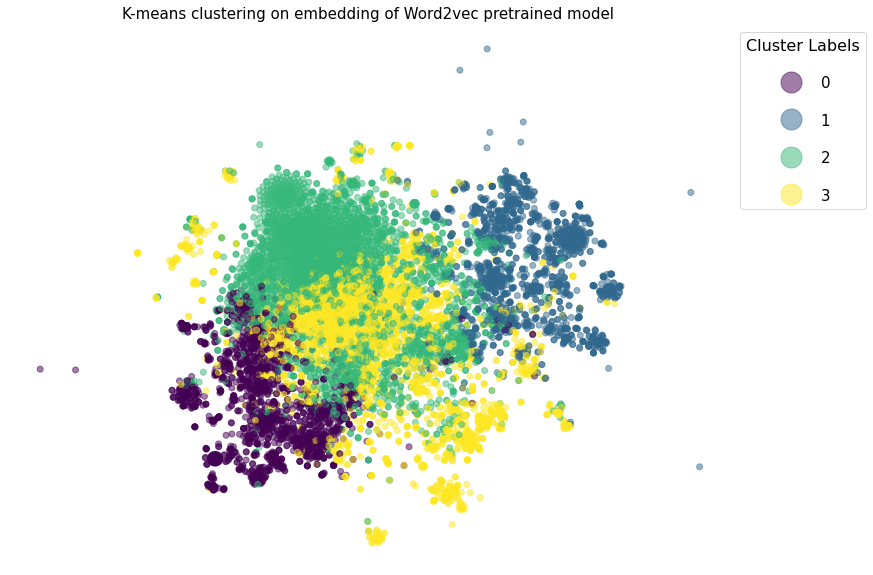

In [ ]:
TSNE_X = reduce_dimension(X)
visualize_clusters(TSNE_X, df_kmeans_word2vec['clusters'], 'K-means clustering on embedding of Word2vec pretrained model ')

In [ ]:
visualize(df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 0, 'clean_string']) 

In [ ]:
df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 0, 'Text'].head(20)

In [ ]:
visualize(df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 1, 'clean_string']) 

In [ ]:
df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 1, 'Text'].head(20)

In [ ]:
visualize(df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 2, 'clean_string']) 

In [ ]:
df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 2, 'Text'].head(20)

In [ ]:
visualize(df_kmeans_word2vec.loc[df_kmeans_word2vec['clusters'] == 3, 'clean_string']) 

The above clusters are redundant. Both cluster 0,1 and 3 has the same topics related to name change.

###Agglomerative clustering on word2vec embedding

In [ ]:
agg_model = agg_cluster(5,X)

In [ ]:
pd.Series(agg_model.labels_).value_counts()

4    6656
1    4199
0    1091
3     431
2      24
dtype: int64

In [ ]:
df_agglo_w2v = df_word2vec_pretrained.copy()
df_agglo_w2v['clusters'] = agg_model.labels_


In [ ]:
from matplotlib.pyplot import figure
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = linkage(X, 'complete')

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


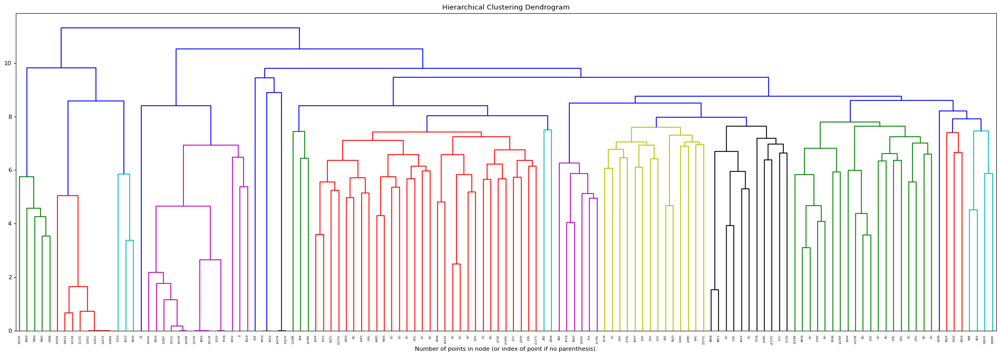

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(30, 10), dpi=80)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
cluster = AgglomerativeClustering(n_clusters=5, affinity='cosine', linkage='complete').fit(X)
plot_dendrogram(cluster, truncate_mode="level", p=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

##Doc2Vec model trained 

###Kmeans on Doc2vec model

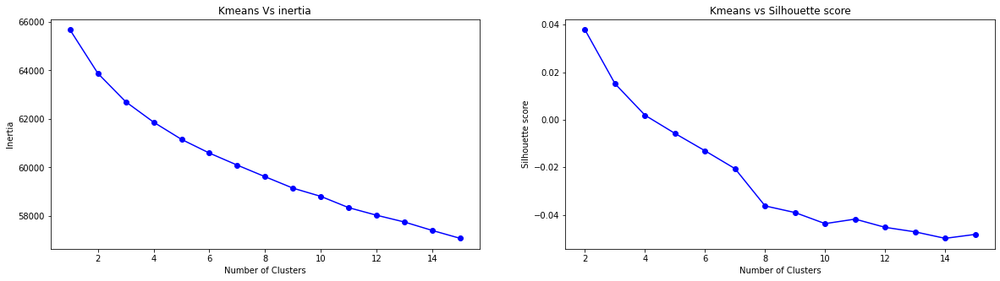

In [ ]:
#K-means on Doc2vec vector
X =  np.array(df_doc_vec['vector'].to_list())

inertia_silhouette(X)

From the above diagram i picked optimum number of clusters as 2


In [ ]:
labels = kmeans(2,X)

Inertia : 63877.2890625, Sillhoute score: 0.037792906165122986


In [ ]:
df_kmeans_doc2vec = df_doc_vec.copy()
df_kmeans_doc2vec['clusters'] = labels
df_kmeans_doc2vec.head()

,Datetime,Text,clean_text,clean_string,vector,clusters
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.1967462, -0.017456653, -0.15433578, 0.19642775, -0.048378058, 0.12985009, 0.0008637231, 0.66010195, -0.42809924, 0.15628038, 0.47094887, -0.27333823, -0.06757916, 0.36487788, -0.2092083, -0.04557292, -0.08682997, 0.17625341, -0.57729506, -0.22875363, 0.76710033, 0.21681479, -0.517616, -0.24276853, -0.45244634, -0.31095585, 0.37356308, -0.20611404, -0.19307558, -0.007968103, -0.1034083, 0.36340955, 0.23931256, -0.38032216, -0.20278202, -0.3240754, -0.3271269, -0.36360595, 0.17045501, 0.24236035, 0.08342251, 0.17723574, -0.25243422, 0.22723953, 0.47491014, 0.34477872, 0.1515117, 0.0013442656, -0.103914015, 0.25596166]",0
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[0.13737513, 0.07418906, -0.15672405, 0.003994729, 0.17108044, -0.34142575, 0.08738551, 0.3940375, -0.16913268, -0.1761838, 0.21260501, -0.55974394, 0.20401748, 0.20913354, -0.0922835, 0.12912305, 0.28332528, 0.069002256, -0.34736767, -0.20457113, 0.22073197, 0.14270492, 0.43425444, -0.044477616, 0.067263655, -0.19132492, -0.24001229, 0.0036342603, -0.18728416, 0.12545735, -0.3052302, 0.017203195, -0.017913632, 0.12563197, -0.21776953, 0.3708368, 0.1278778, 0.16697967, -0.020238515, -0.060025603, 0.35568914, -0.19725278, 0.299171, 0.5350052, 0.3851806, -0.04440323, -0.04885316, -0.36614126, 0.38339287, 0.25642326]",1
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content,"[0.30959997, -0.5657907, -0.38650027, 0.47359478, 0.39398262, -0.057646155, 0.22245507, 1.3869934, -0.8909324, 0.5375819, -0.78613144, -0.1756735, -0.5250467, -0.09620131, 0.36754015, -0.37779883, -0.14345126, -0.8445309, -0.7108339, -0.90905315, 0.17399888, 1.4865743, -0.18513794, -0.7782059, 0.38069418, -0.32412848, -0.30772784, -0.3468614, -0.64106405, -0.07344682, 0.85198677, 0.76865375, 1.0689986, 1.4750994, 0.11351276, 1.2186438, -0.7267661, 0.05073326, -1.3089285, 1.0911602, 0.39185205, -0.9187349, -0.10705033, 0.94355077, 0.22949198, -0.3545574, -0.21723337, 0.098623574, -0.41496444, 0.16031604]",1
3,2021-10-01 00:50:05+00:00,"Global experts met on StreamYard to prep for 2022 produced by @KeithKeller. \n\nKeith's been testing online events that broadcast to YouTube, LinkedIn, Facebook, Twitter + \n\nImpressive convo on: \n#SocialAudio \n#VirtualEvents \n#Metaverse \n\nRecording useful for #remotworkforce https://t.co/DcLyL5hoA4","[global, expert, meet, streamyard, prep, produce, keith, test, online, event, broadcast, youtube, linkedin, twitter, impressive, convo, socialaudio, virtualevent, record, useful, remotworkforce]",global expert meet streamyard prep produce keith test online event broadcast youtube linkedin twitter impressive convo socialaudio virtualevent record useful remotworkforce,"[-0.11496324, -0.21082613, -0.15823632, 0.868038, 0.25970563, -1.1404673, -0.4247809, 0.9831171, -0.9203065, -0.29875425, -0.10290987, -0.15488447, -0.3325723, -0.63743764, -0.036960524, 0.39529186, -0.006328482, 0.05056286, -

In [ ]:
visualize(df_kmeans_doc2vec.loc[df_kmeans_doc2vec['clusters'] == 0, 'clean_string']) 

In [ ]:
visualize(df_kmeans_doc2vec.loc[df_kmeans_doc2vec['clusters'] == 1, 'clean_string']) 

Optimum number of clusters based on inertia and sillhoutte score is 2. Cluster 1 shows that facebook is hiring a lot for creating metaverse and also shows name change announcement. The cluster 2 shows the name change announcement by Zuckerberg. 

Doc2vec is not good with kmeans. The plot above shows that the data is not seperated well. The word cloud also shows that "change name topic" is coming in both the clusters.

###Agglomerative clustering on Doc2Vec embedding

In [ ]:
agg_model = agg_cluster(5,X)

In [ ]:
pd.Series(agg_model.labels_).value_counts()

1    5488
0    2278
2    2267
3    1424
4     944
dtype: int64

In [ ]:
df_agglo_w2v = df_word2vec_pretrained.copy()
df_agglo_w2v['clusters'] = agg_model.labels_


In [ ]:
visualize(df_agglo_w2v.loc[df_agglo_w2v['clusters'] == 0, 'clean_string']) 

In [ ]:
visualize(df_agglo_w2v.loc[df_agglo_w2v['clusters'] == 2, 'clean_string']) 

In [ ]:
visualize(df_agglo_w2v.loc[df_agglo_w2v['clusters'] == 3, 'clean_string']) 

In [ ]:
visualize(df_agglo_w2v.loc[df_agglo_w2v['clusters'] == 4, 'clean_string']) 

The clusters from agglomerative clusters are redundant the terms 'go,'name,'change' are appearing in all the clusters. Training the tweets with doument to vector model is not good with both the clustering methods.


##Transformer model - all-MiniLM-L6-v2




In [ ]:
df_bert = df.loc[:,['Datetime','Text','clean_text','clean_string']]
df_bert.head()

,Datetime,Text,clean_text,clean_string
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the met...,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Meta...,"[spend, million, build, responsibly, via]",spend million build responsibly via
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I...,"[be, happy, maciphone, user, be, concerned, ap...",be happy maciphone user be concerned apple con...
3,2021-10-01 00:50:05+00:00,Global experts met on StreamYard to prep for 2...,"[global, expert, meet, streamyard, prep, produ...",global expert meet streamyard prep produce kei...
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsib...,"[spend, million, responsibly, build, via]",spend million responsibly build via


In [ ]:
pip install sentence-transformers

     |████████████████████████████████| 78 kB 3.0 MB/s 
     |████████████████████████████████| 3.1 MB 9.0 MB/s 
     |████████████████████████████████| 3.3 MB 39.9 MB/s 
     |████████████████████████████████| 1.2 MB 39.9 MB/s 
     |████████████████████████████████| 59 kB 6.4 MB/s 
     |████████████████████████████████| 596 kB 66.4 MB/s 
     |████████████████████████████████| 895 kB 68.4 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.1.0-py3-none-any.whl size=121000 sha256=60076d1f33d9eb832ebbab15e7e13500cb2be33e9acfdf49ee61d031a9bc85c6
  Stored in directory: /root/.cache/pip/wheels/90/f0/bb/ed1add84da70092ea526466eadc2bfb197c4bcb8d4fa5f7bad
Successfully built sentence-transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


This is a sentence-transformers model: It maps sentences & paragraphs to a 384 dimensional dense vector space and can be used for tasks like clustering or semantic search. It is  fine-tuned in on a 1B sentence pairs dataset.

In [ ]:
from sentence_transformers import SentenceTransformer

#sbert_model = SentenceTransformer('bert-base-nli-mean-tokens')      # 768 tokens
sbert_model = SentenceTransformer('all-MiniLM-L6-v2') 

In [ ]:
from tqdm.notebook import tqdm
tqdm.pandas()


In [ ]:
df_bert['vector'] =  df_bert['Text'].progress_apply(lambda txt: sbert_model.encode(txt))

  0%|          | 0/13515 [00:00<?, ?it/s]

In [ ]:
df_bert.head()

,Datetime,Text,clean_text,clean_string,vector
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the met...,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.014264205, -0.043805897, -0.026493305, -0.0..."
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Meta...,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[-0.01710065, 0.014353143, -0.02779304, -0.010..."
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I...,"[be, happy, maciphone, user, be, concerned, ap...",be happy maciphone user be concerned apple con...,"[0.03682046, -0.028146282, -0.020548953, -0.04..."
3,2021-10-01 00:50:05+00:00,Global experts met on StreamYard to prep for 2...,"[global, expert, meet, streamyard, prep, produ...",global expert meet streamyard prep produce kei...,"[-0.06826861, -0.0747282, -0.011030502, -0.066..."
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsib...,"[spend, million, responsibly, build, via]",spend million responsibly build via,"[-0.00738326, 0.029298766, -0.026504872, 0.017..."


###Kmeans on MiniLM embedding

In [ ]:
X =  np.array(df_bert['vector'].to_list())

In [ ]:
X.shape

(13515, 384)

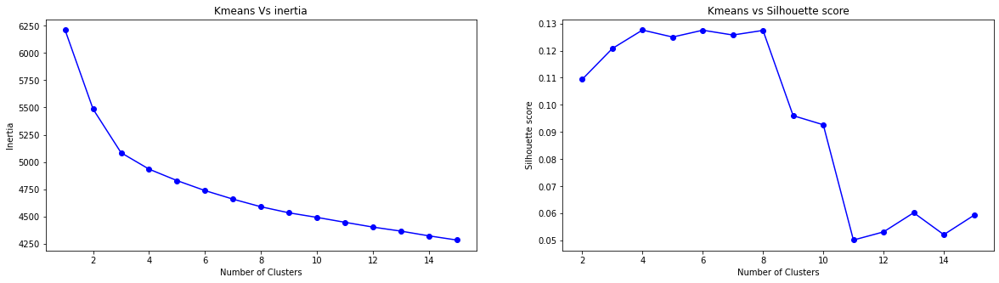

In [ ]:
inertia_silhouette(X)

The first figure shows that 3 is optimum but from the second figure we can confirm that 4 is an optimum value based on the sillouette score

In [ ]:
labels = kmeans(4,X)

Inertia : 4934.12109375, Sillhoute score: 0.12752313911914825


In [ ]:
df_kmeans_bert = df_bert.copy()
df_kmeans_bert['clusters'] = labels


In [ ]:
pd.Series(labels).value_counts()

2    4031
3    3245
0    3198
1    3041
dtype: int64

In [ ]:
TSNE_X = reduce_dimension(X)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


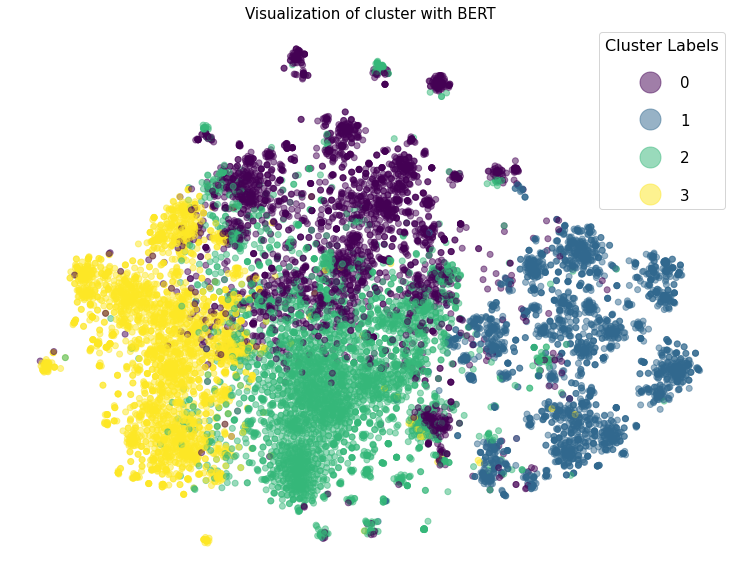

In [ ]:
visualize_clusters(TSNE_X, df_kmeans_bert['clusters'], "Visualization of cluster with BERT")

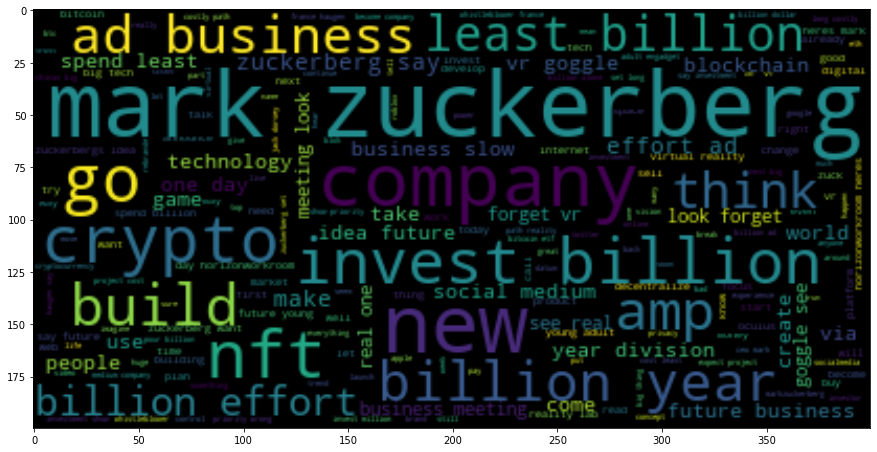

In [ ]:
visualize(df_kmeans_bert.loc[df_kmeans_bert['clusters'] == 0, 'clean_string']) 

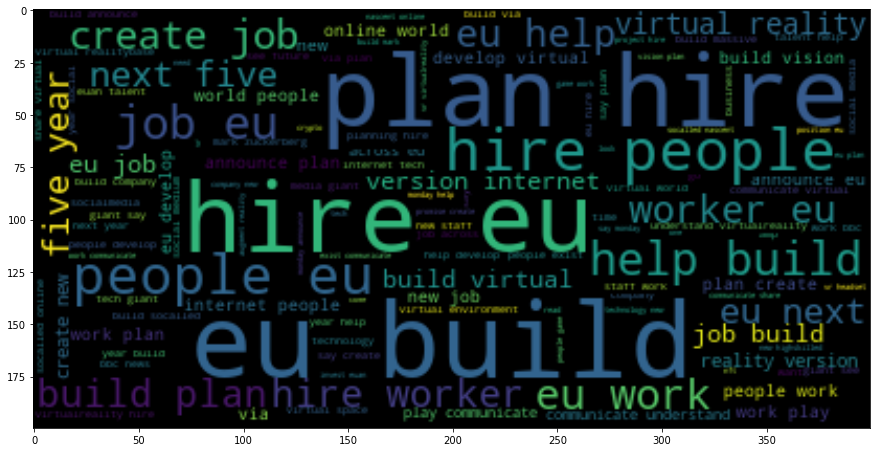

In [ ]:
visualize(df_kmeans_bert.loc[df_kmeans_bert['clusters'] == 1, 'clean_string']) 

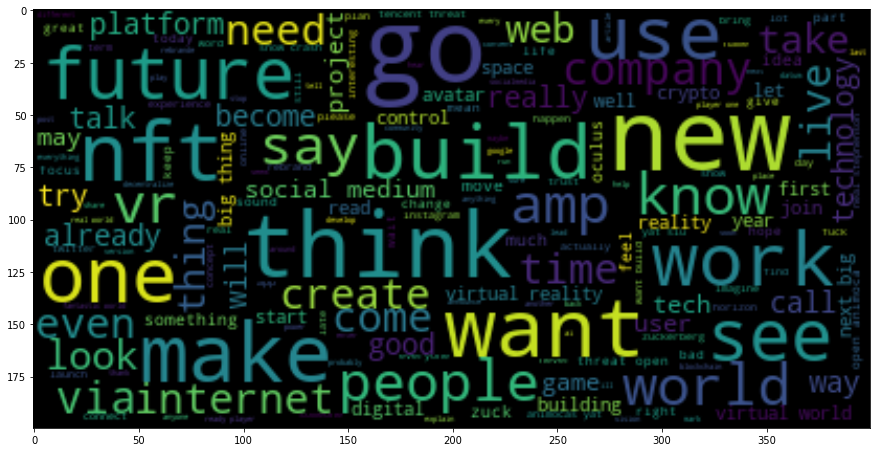

In [ ]:
visualize(df_kmeans_bert.loc[df_kmeans_bert['clusters'] == 2, 'clean_string']) 

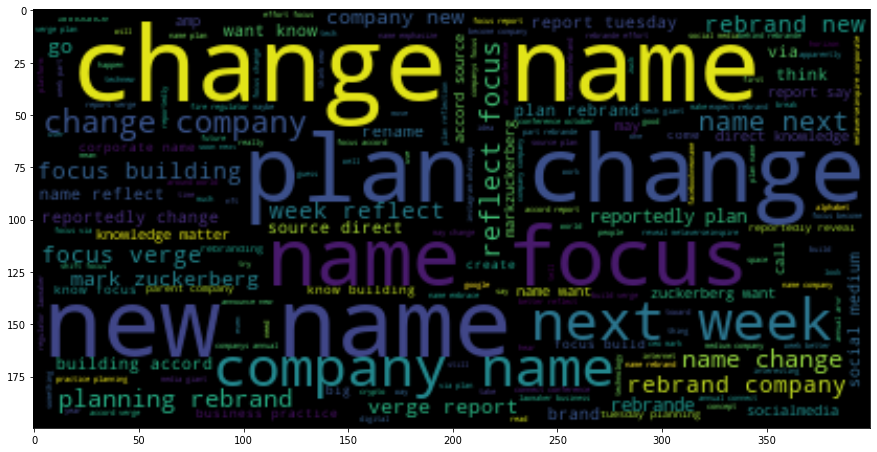

In [ ]:
visualize(df_kmeans_bert.loc[df_kmeans_bert['clusters'] == 3, 'clean_string']) 

###Agglomerative clustering on MiniLM Embedding

In [ ]:

from sklearn.cluster import AgglomerativeClustering
agg_model = agg_cluster(5,X)


In [ ]:
pd.Series(agg_model.labels_).value_counts()

0    5539
4    4766
3    2556
2     559
1      95
dtype: int64

In [ ]:
df_bert_agg = df_bert.copy()

df_bert_agg['cluster'] = agg_model.labels_
df_bert_agg.head()

,Datetime,Text,clean_text,clean_string,vector,cluster
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the met...,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian,"[0.014264205, -0.043805897, -0.026493305, -0.0...",2
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Meta...,"[spend, million, build, responsibly, via]",spend million build responsibly via,"[-0.01710065, 0.014353143, -0.02779304, -0.010...",4
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I...,"[be, happy, maciphone, user, be, concerned, ap...",be happy maciphone user be concerned apple con...,"[0.03682046, -0.028146282, -0.020548953, -0.04...",4
3,2021-10-01 00:50:05+00:00,Global experts met on StreamYard to prep for 2...,"[global, expert, meet, streamyard, prep, produ...",global expert meet streamyard prep produce kei...,"[-0.06826861, -0.0747282, -0.011030502, -0.066...",1
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsib...,"[spend, million, responsibly, build, via]",spend million responsibly build via,"[-0.00738326, 0.029298766, -0.026504872, 0.017...",4


In [ ]:
visualize(df_bert_agg.loc[df_bert_agg['cluster'] == 0, 'clean_string']) 

In [ ]:
visualize(df_bert_agg.loc[df_bert_agg['cluster'] == 4, 'clean_string']) 

In [ ]:
visualize(df_bert_agg.loc[df_bert_agg['cluster'] == 3, 'clean_string']) 

In [ ]:
visualize(df_bert_agg.loc[df_bert_agg['cluster'] == 2, 'clean_string']) 

In [ ]:
df_bert_agg.loc[df_bert_agg['cluster'] == 2, 'Text'].head(5)

0                                                                                                                                                                                                                 Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN
19                                                                                                                                                                                                                                 laugh at facebook in the metaverse all you want, Oculus Quest 2 is the closest thing we have.
38    We all know that Virtual Reality is our present,\n\nBut what is the future of VR?\n\nWhat’s after this?\n\nFacebook and Microsoft have just announced creating a metaverse in the near future,\n\nVisit us now: https://t.co/O39ZbVni7U\n.\n.\n#xpertsmix #vr #virtualreality #facebook #Microsoft https://t.co/AKqeJlSdhP
41                                   

In [ ]:
visualize(df_bert_agg.loc[df_bert_agg['cluster'] == 1, 'clean_string']) 

In [ ]:
df_bert_agg.loc[df_bert_agg['cluster'] == 1, 'Text']

##BERT base model
Bert is a bidirectional encoder representation. It was trained over 3 million words from english wikipedia and book corpus.It was trained to produce the representation by jointly conditioning on both left and right context. So it learns the token from both the sides.

In [ ]:
df_bert_base = df.loc[:,['Datetime','Text','clean_text','clean_string']]
df_bert_base.head()

,Datetime,Text,clean_text,clean_string
0,2021-10-01 00:06:16+00:00,Is Facebook leading us on a journey to the metaverse? | Virtual reality | The Guardian https://t.co/JmyDjBYFeN,"[lead, us, journey, virtual, reality, guardian]",lead us journey virtual reality guardian
1,2021-10-01 00:29:20+00:00,Facebook Is Spending $50 Million to Build Metaverse—'Responsibly' (via @decryptmedia) https://t.co/28fBVvD366,"[spend, million, build, responsibly, via]",spend million build responsibly via
2,2021-10-01 00:46:08+00:00,@Scobleizer I’m a happy Mac/iPhone user. But I’m concerned about Apple content control. My mild art was banned from an Apple Newsstand cover (nipple) — same art hung in G-rated galleries and published on IRL newsstands. Facebook is just as bad.\n\nMetaverse should be open to all legal content.,"[be, happy, maciphone, user, be, concerned, apple, content, control, mild, art, ban, apple, newsstand, cover, nipple, art, hang, grate, gallery, publish, irl, newsstand, bad, open, legal, content]",be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content
3,2021-10-01 00:50:05+00:00,"Global experts met on StreamYard to prep for 2022 produced by @KeithKeller. \n\nKeith's been testing online events that broadcast to YouTube, LinkedIn, Facebook, Twitter + \n\nImpressive convo on: \n#SocialAudio \n#VirtualEvents \n#Metaverse \n\nRecording useful for #remotworkforce https://t.co/DcLyL5hoA4","[global, expert, meet, streamyard, prep, produce, keith, test, online, event, broadcast, youtube, linkedin, twitter, impressive, convo, socialaudio, virtualevent, record, useful, remotworkforce]",global expert meet streamyard prep produce keith test online event broadcast youtube linkedin twitter impressive convo socialaudio virtualevent record useful remotworkforce
4,2021-10-01 02:14:32+00:00,Facebook is spending $50 million to ‘responsibly’ build the metaverse https://t.co/JpkHbRlJgR via @Verge,"[spend, million, responsibly, build, via]",spend million responsibly build via


In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
sbert_model_1 = SentenceTransformer('bert-base-nli-mean-tokens')  


In [ ]:
df_bert_base['vector'] =  df_bert_base['Text'].progress_apply(lambda txt: sbert_model_1.encode(txt))

  0%|          | 0/13515 [00:00<?, ?it/s]

###Kmeans on BERT base model

In [ ]:
X =  np.array(df_bert_base['vector'].to_list())

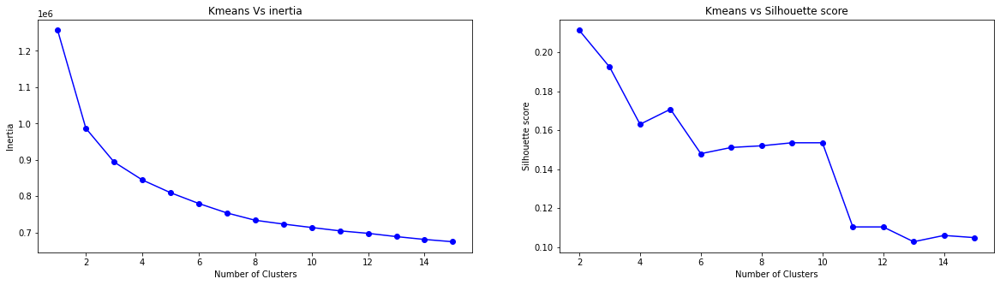

In [ ]:
inertia_silhouette(X)

From the above diagram we can see the inertia decreasing steeply till 3 and then gradually decreases. So 3 is optimum. Although sillouette score suggests that 2 is maximum, three is not bad either so we can try both.

In [ ]:
labels = kmeans(3,X)

Inertia : 894099.875, Sillhoute score: 0.1925077885389328


In [ ]:
df_kmeans_bert_base = df_bert_base.copy()
df_kmeans_bert_base['clusters'] = labels


In [ ]:
pd.Series(labels).value_counts()

2    6107
1    3784
0    3624
dtype: int64

In [ ]:
TSNE_X = reduce_dimension(X)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


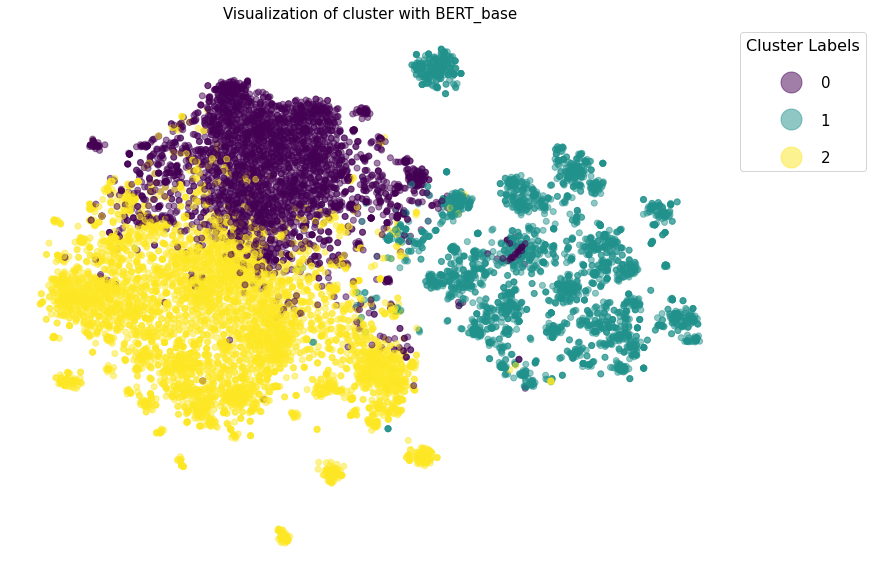

In [ ]:
visualize_clusters(TSNE_X, df_kmeans_bert_base['clusters'], "Visualization of cluster with BERT_base")

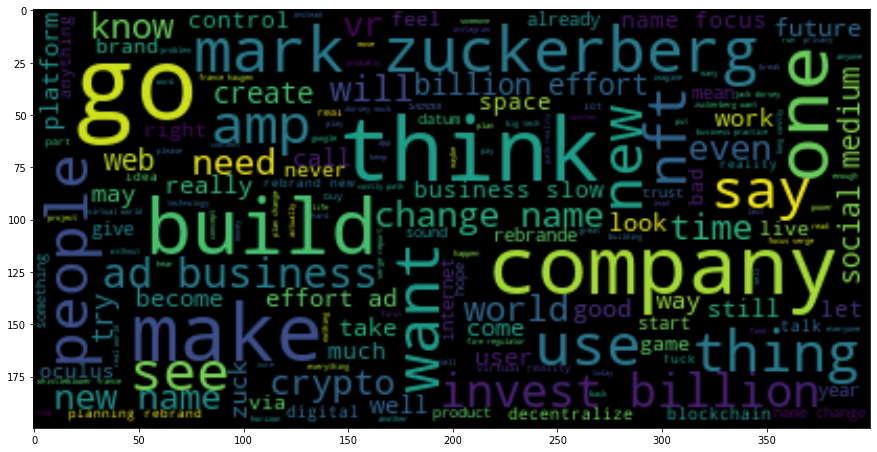

In [ ]:
visualize(df_kmeans_bert_base.loc[df_kmeans_bert_base['clusters'] == 0, 'clean_string']) 

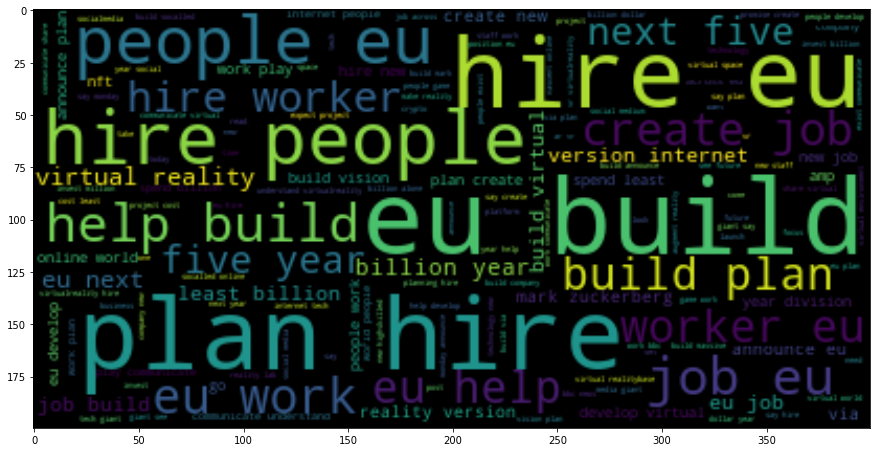

In [ ]:
visualize(df_kmeans_bert_base.loc[df_kmeans_bert_base['clusters'] == 1, 'clean_string']) 

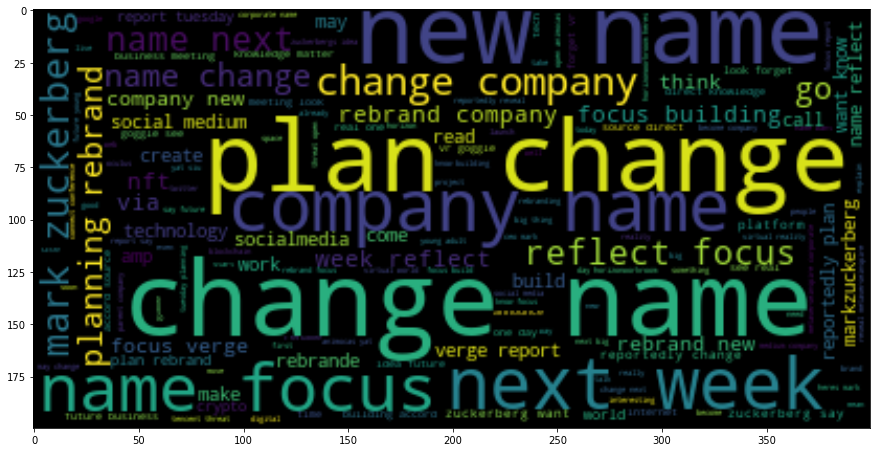

In [ ]:
visualize(df_kmeans_bert_base.loc[df_kmeans_bert_base['clusters'] == 2, 'clean_string']) 

Bert base looks like a very good cluster. First cluster shows crypto and investments. The second cluster shows the hiring people eu and the third shows the name change. Also clusters loooks pretty seperate.

###Agglomerative clustering on Bert base model

In [ ]:
from sklearn.cluster import AgglomerativeClustering

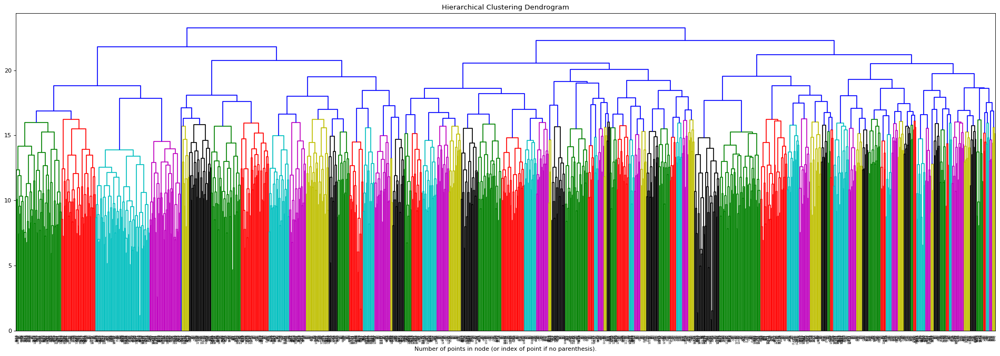

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(30, 10), dpi=80)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top ten levels of the dendrogram
cluster = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='cosine', linkage='complete').fit(X)
plot_dendrogram(cluster, truncate_mode="level", p=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

From the dendrogram we can figure out that distance is pretty good if we cut the tree with 4 clusters

In [ ]:
agg_model = agg_cluster(5,X)


In [ ]:
pd.Series(agg_model.labels_).value_counts()

3    5181
2    4829
1    1286
0    1134
4    1085
dtype: int64

In [ ]:
df_agg_bert_base = df_bert_base.copy()
df_agg_bert_base['clusters_5'] = agg_model.labels_

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 0, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 0, 'Text']

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 1, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 1, 'Text']

10                                                                                                                                                                                                IDK if kink is what regular people want, but this thread is spot on about past metaverse failures. IMO, MOOs were the only interesting places to hang out, and any Facebook entry will be prone to many of these failure modes, especially commerce. https://t.co/w11eUbFKWD
11                                                                                                                                                                                                                                                                                               TikTok and Twitter embracing NFTs. Facebook building a metaverse. Celebrities using NFTs as their profile pics. We are entering into the "win" phase. https://t.co/7WYHNKoznc
18                                                                        

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 2, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 2, 'Text']

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 3, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 3, 'Text']

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 4, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_5'] == 4, 'Text']

In [ ]:
visualize_clusters(TSNE_X, df_agg_bert_base['clusters_5'], "Visualization of agglomerative cluster with BERT_base")

In [ ]:
agg_model = agg_cluster(4,X)

In [ ]:
pd.Series(agg_model.labels_).value_counts()

3    5181
2    4829
0    2371
1    1134
dtype: int64

In [ ]:
#df_agg_bert_base = df_bert_base.copy()
df_agg_bert_base['clusters_4'] = agg_model.labels_


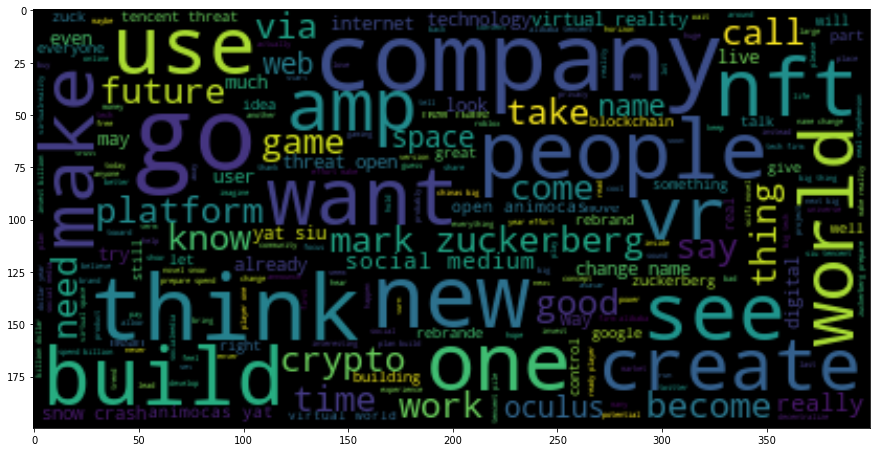

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 0, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 0, 'Text']

10                                                                                                                                                                                                IDK if kink is what regular people want, but this thread is spot on about past metaverse failures. IMO, MOOs were the only interesting places to hang out, and any Facebook entry will be prone to many of these failure modes, especially commerce. https://t.co/w11eUbFKWD
11                                                                                                                                                                                                                                                                                               TikTok and Twitter embracing NFTs. Facebook building a metaverse. Celebrities using NFTs as their profile pics. We are entering into the "win" phase. https://t.co/7WYHNKoznc
18                                                                        

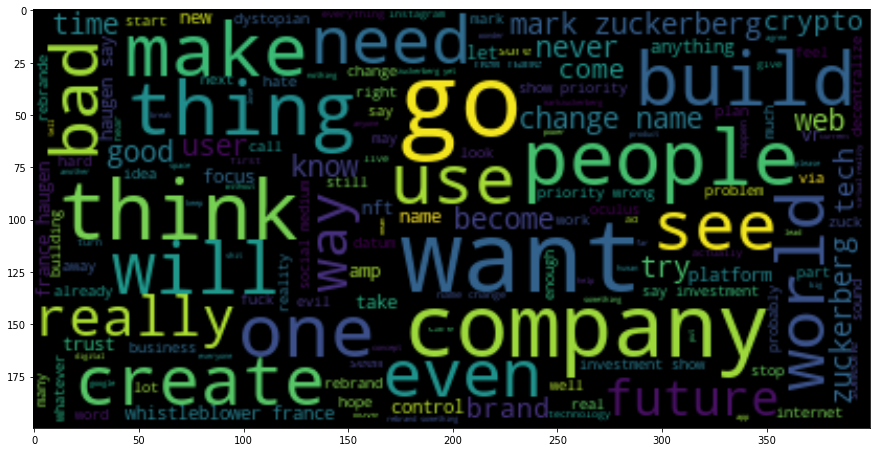

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 1, 'clean_string'])  

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 1, 'Text']

29                                                                                                                                                                                                                                                                                                                     Why @Facebook’s premature talk about a #metaverse will likely backfire, by Mark Sullivan in @FastCompany https://t.co/e4E7L3Qrbp
33                                                                                                                                                                             https://t.co/KFY5DDVuGw &gt; "Why #Facebook’s #prematuretalk about a #metaverse will likely #backfire: The #AR and #VR industry has already been #harmed by several #cycles of #hype and #disappointment. Facebook may be creating another one." https://t.co/cpLqAyVKoB
35                                                                                                                      

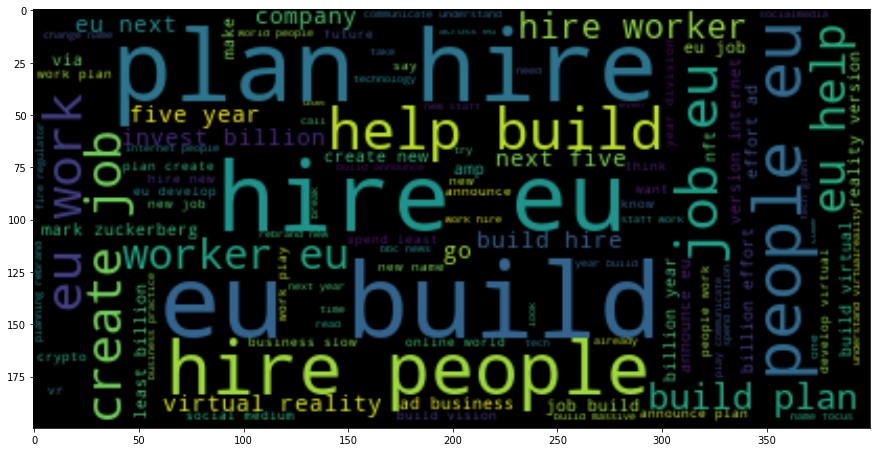

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 2, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 2, 'clean_string']

1                                                                                                                                                                                      spend million build responsibly via
2                                                 be happy maciphone user be concerned apple content control mild art ban apple newsstand cover nipple art hang grate gallery publish irl newsstand bad open legal content
4                                                                                                                                                                                      spend million responsibly build via
5                                            plus invest mil zuck recent intv neistat talk bring think go explode also scary though vast potential vast risk still suspect unavoidable eventually esp device like oc quest
6                                                                                                                           

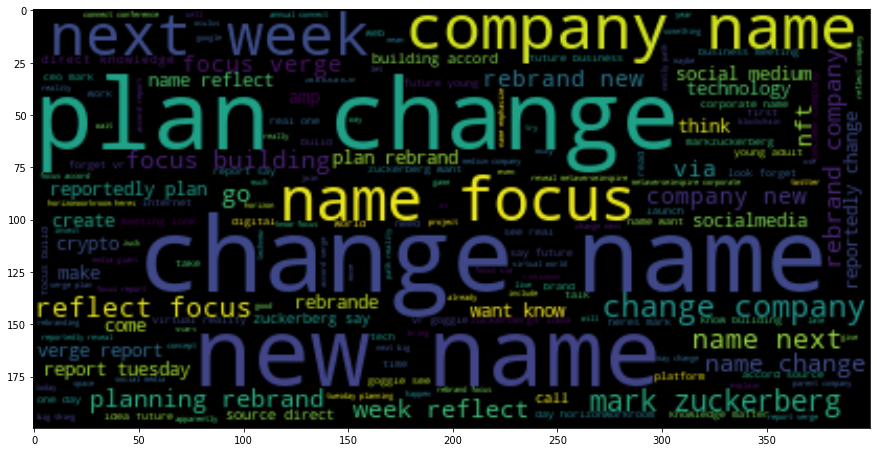

In [ ]:
visualize(df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 3, 'clean_string']) 

In [ ]:
df_agg_bert_base.loc[df_agg_bert_base['clusters_4'] == 3, 'clean_string']

0                                                                                                                                                                                                lead us journey virtual reality guardian
3                                                            global expert meet streamyard prep produce keith test online event broadcast youtube linkedin twitter impressive convo socialaudio virtualevent record useful remotworkforce
7                                                                                                                                                                                                    see creator economy step towards via
8                                                                            veut remplacer les smartphones machinelearne ai python datascience bigdata deeplearne iot daysofcode robot tech insurtech artificialintelligence tech nocode
9                                                               

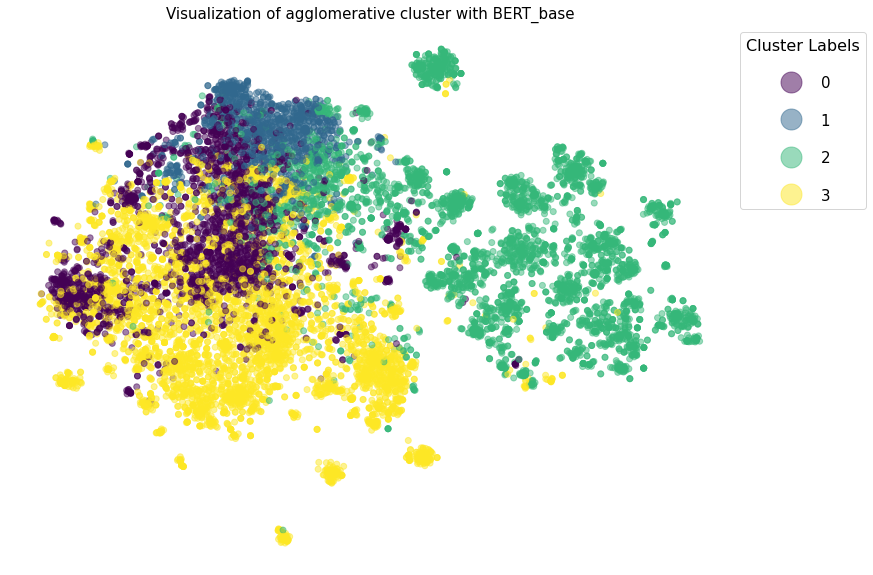

In [ ]:
visualize_clusters(TSNE_X, df_agg_bert_base['clusters_4'], "Visualization of agglomerative cluster with BERT_base")

#Results and Discussion


**Glove :**
I used 2 and 3 clusters for kmeans algorithm and the resultant word cloud shows that if I use three clusters, then some terms are more common in all the clusters. The term ‘change’,’ name’ is common in three of the clusters as shown below. Also word ‘go’ and ‘amp’ is widely present in two clusters

When I used 2 clusters, the first cluster shows keywords ‘name’, ‘change’, the second one shows ‘hire’,’eu’,’build’  So I chose 2.

With Agglomerative clustering, I was able to get 20 clusters in which 5 of them are significant and the others are outliers so I removed it. 

**WORD2VEC:**
When I tried K means on word2vec, I found 4 as optimum number of cluster based on elbow graph and silloutte graph. Three of those clusters were having name change tweets. Comparitively glove works better for my work. That is because glove is trained on twitter dataset and word2vec on wikipidia that is why glove is better for  my work.
Although k means was bad, agglomerative clustering was able to figure out three clusters, one on hiring, another on crypto related facts, one with the investment in billions, one with same as crypto and another one is just noise. 

**Doc2vec:**	
I tried to train the doc2vec algorithm on my corpus, But the performance is very bad. The clusters in both k means and agglomerative shows that the clusters are not seperated well its kind of mixed up.

**all-MiniLM-L6-v2**
I have got 4 clusters, which are pretty good. First cluster is about crypto and billion dollar investment in the next few years. The second cluster is all about hiring. Third one is people general opinion and the last one is just about the name change.
With agglomerative clustering I got one new cluster showing the live sessions like you tube, podcast. The agglomerative clustering tries to find more fine clusters.

**BERT base model**

I found the bert base model is much better. The clusters are not redundant and the interpratation is also much better.Agglomerative clustering gives one cluster that is more of people opinion and the others are related to nft,vr, hiring and siu's comment of facebook is a threat to open metaverse.


Below are the results I got from agglomerative clustering

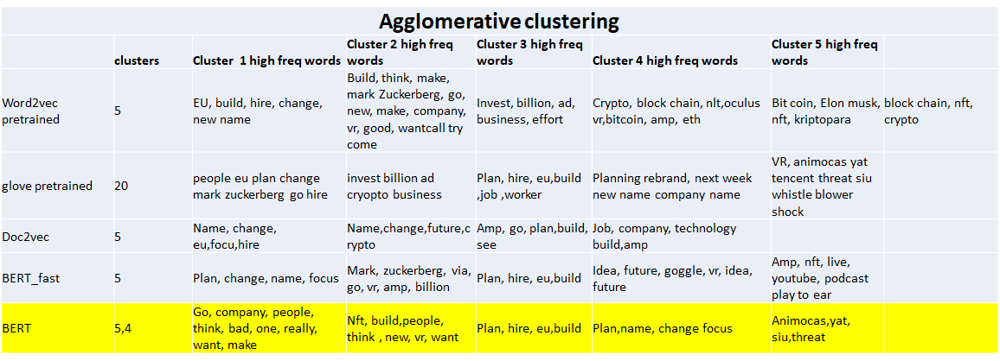

Below are the results I got with bert and agglomerative clustering.

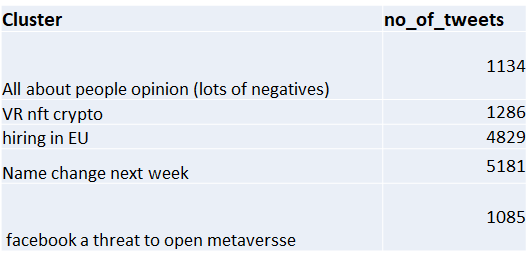

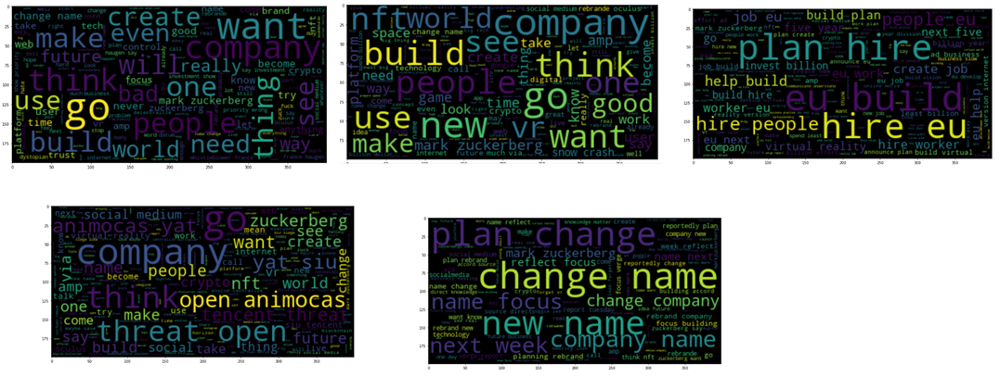

From above word cloud, the first cloud has negative words like bad,dystopian, fuck and some neutral comments as well. 
The second one is all about vr and nft. 
The third cluster is about hiring
The fourth is about threat, animocas
Fifth is all general about the name change.
I found Bert took longer to work with, but the embeddings are very good and the results are good as well.

#Conclusion
Based on the clusters, Below are the interpretations about the tweets

*   People are curious about VR, nft, crypto

*   People have discussions about facebook hiring heavily in European union.
*   people talking about "Facebook a threat to open metaverse"

*   General discussions about name change(both positive and negative)





#Challenges
I tried working with 40,000 tweets and the Ram was crashing when i run embeddings. So I just reduced the dataset and analysed the tweets till Oct 27.

#Future work

Unsupervised data is hard to interpret. So my future work is to get more tweets and label it based on the emoticons on the tweets and see whether model is able to find the positive and negative sentiment.

#References:


*   I have done this project as the extension of the project I do in the machine learning class along with my team members.
*   Jeffrey Pennington, Richard Socher, and Christopher D. Manning. 2014. GloVe: Global Vectors for Word Representation. 
https://nlp.stanford.edu/projects/glove/ 

* https://radimrehurek.com/gensim/auto_examples/tutorials/run_doc2vec_lee.html#sphx-glr-auto-examples-tutorials-run-doc2vec-lee-py
*   https://cs.stanford.edu/~quocle/paragraph_vector.pdf
*   https://nlp.stanford.edu/projects/glove/

*   https://arxiv.org/pdf/1301.3781.pdf (Word2vec paper)
*   https://arxiv.org/abs/1810.04805 (BERT model)
*   https://arxiv.org/abs/1908.10084 (sentence BERT - transformer)


*   https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2
  







